# Countries Clustering

![image](countries-in-the-world.jpg)

<a class="anchor" id="About_Data"></a>
# <p style="padding:10px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">About Data</p> 

<div style="background-color:#d5eae9; padding:20px; font-size:15px">

**Content:** 

The scope of this project is to cluster world countries, based on socio-economic and health factors, to determine the overall development of a country in order to assist HELP International, as well as other NGOs, use their funds strategically and effectively. Therefore, the project aims to recommend a clustering algorithm able to categorize the data into the highest number of distinct.

**Description of features:**
    
1- country: Name of the country
    
2- child_mort: Death of children under 5 years of age per 1000 live births
    
3- exports: Exports of goods and services per capita. Given as %age of the GDP per capita
    
4- health: Total health spending per capita. Given as %age of GDP per capita    
    
5- imports: Imports of goods and services per capita. Given as %age of the GDP per capita
    
6- income: Net income per person
    
7- inflation: The measurement of the annual growth rate of the Total GDP
    
8- life_expec: The average number of years a new born child would live
    
9- total_fer: The number of children that would be born to each woman

10- gdpp: The GDP per capita. Calculated as the Total GDP divided by the total population.
    
**Objective:**   
    
The clustering goal is to first use **Principal componenet Analysis (PCA)** and then apply these five popular clustering algorithms on that: **K-Means Clustering**, **Hierarchical Clustering**, **Gaussian Mixture Clustering**, **Mini-batch K-Means Clustering**, and **DBSCAN**.

In [1]:
#Import libraries
#loading dataset
import pandas as pd
import numpy as np

#visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
from kneed import KneeLocator

# Algorithms
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import ward,dendrogram,linkage,cut_tree
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN
from itertools import product
from sklearn.neighbors import NearestNeighbors
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xg


# Train Test Split
from sklearn.model_selection import train_test_split

# scipy library for hierarchical clustering
from scipy.cluster.hierarchy import ward, dendrogram, linkage
from scipy.cluster import hierarchy

# Model performance
from sklearn.preprocessing import  StandardScaler
from sklearn import metrics
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

#warnings
import warnings
warnings.simplefilter(action='ignore')

In [2]:
# reading data into dataframe
df=pd.read_csv('E:\Machine Learning\IMT/Country-data.csv')
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [3]:
df.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


In [4]:
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df)

,column,dtypes,nunique,sum_null
0,country,object,167,0
1,child_mort,float64,139,0
2,exports,float64,147,0
3,health,float64,147,0
4,imports,float64,151,0
5,income,int64,156,0
6,inflation,float64,156,0
7,life_expec,float64,127,0
8,total_fer,float64,138,0
9,gdpp,int64,157,0


- No null values present in the data!

<a class="anchor" id="About_Data"></a>
# <p style="padding:10px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Exploratory Data Analysis</p> 

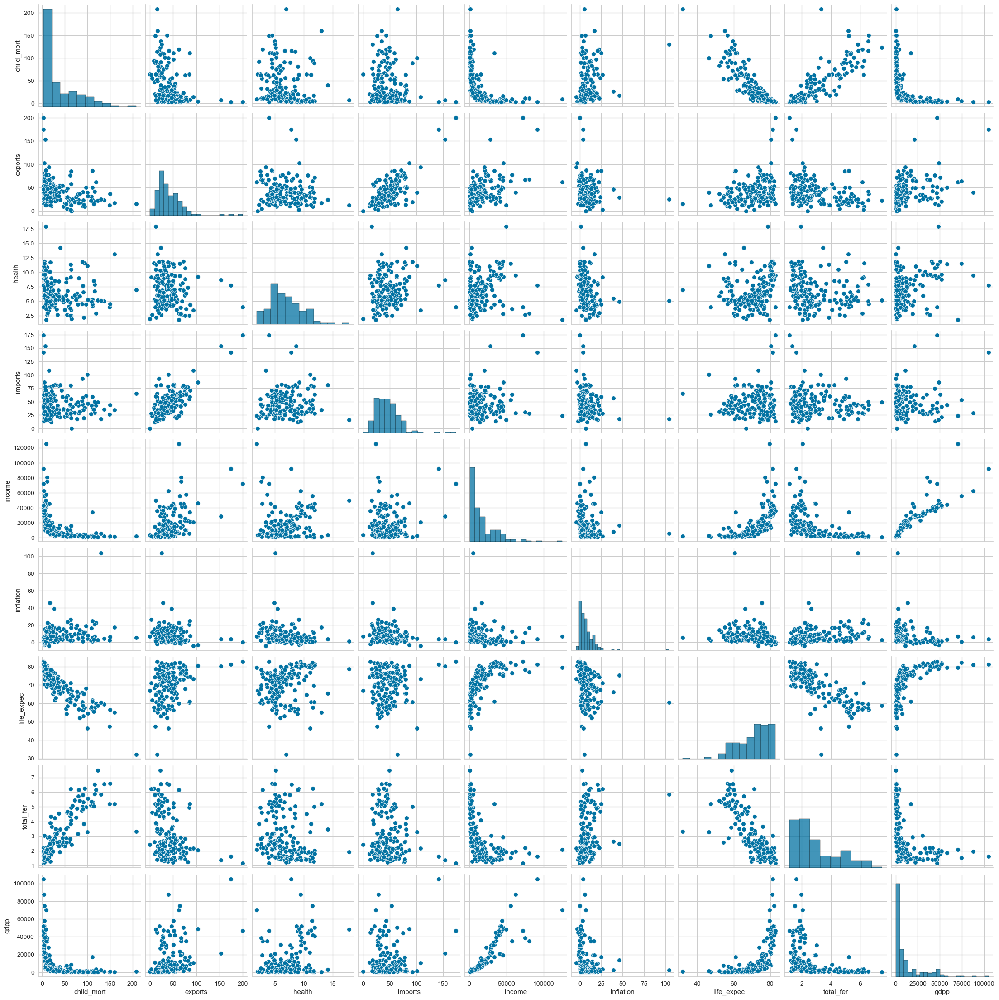

In [5]:
sns.pairplot(df)

In [6]:
df_numerical = df.drop(['country'], axis=1)
# dtype to float
df_numerical = df_numerical.astype(float)

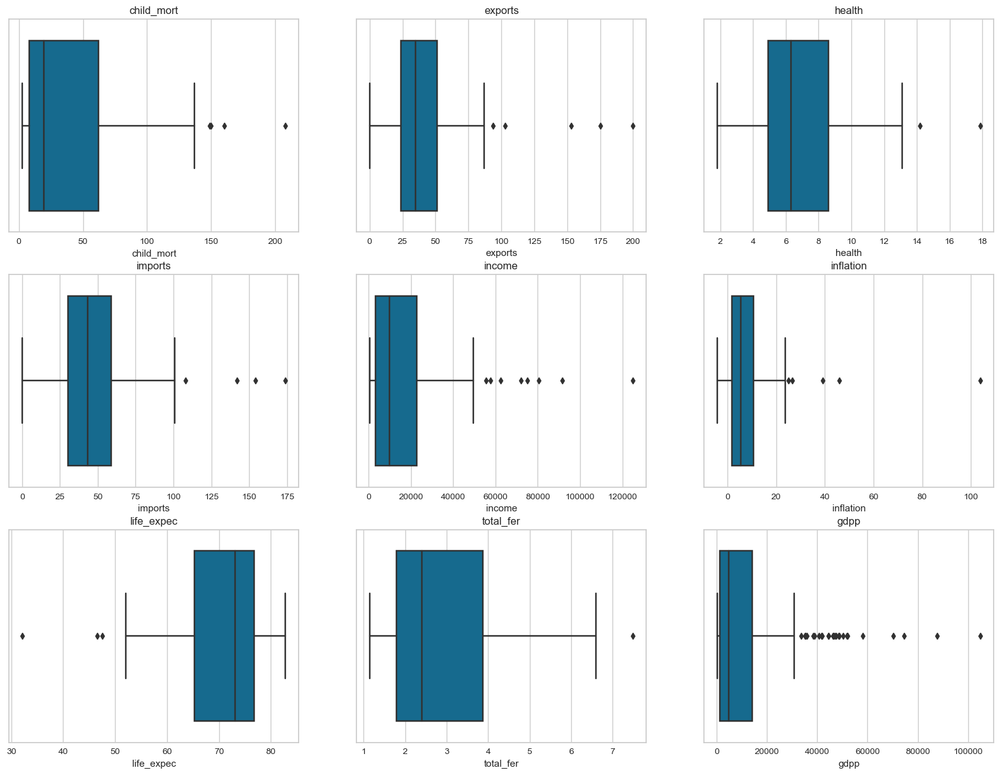

In [7]:
# looking for outliers for all features 
plt.figure(figsize=(20, 20))
for i, col in enumerate(df_numerical.columns[0:]):
    plt.subplot(4, 3, i+1)
    sns.boxplot(df_numerical[col])
    plt.title(col)  
plt.show()

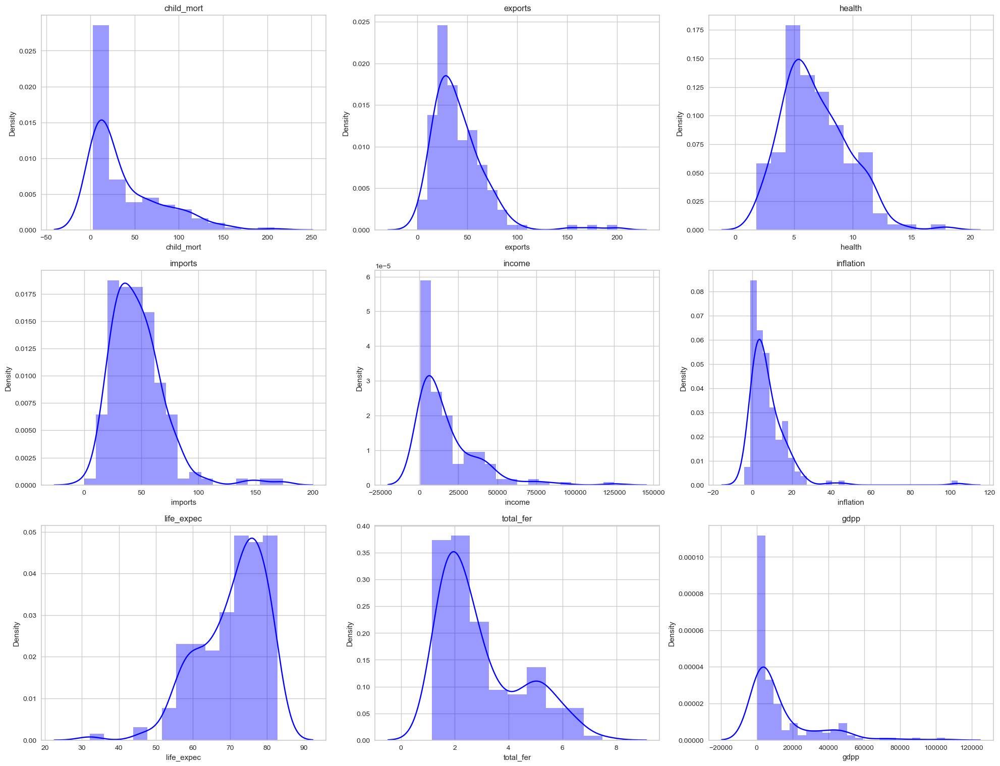

In [8]:
# to see the distributions of all features
plt.figure(figsize=(20, 20))
for i, col in enumerate(df_numerical.columns[0:]):
    plt.subplot(4, 3, i+1)
    sns.distplot(df_numerical[col], color='blue')
    plt.title(col)
plt.tight_layout()
plt.show()

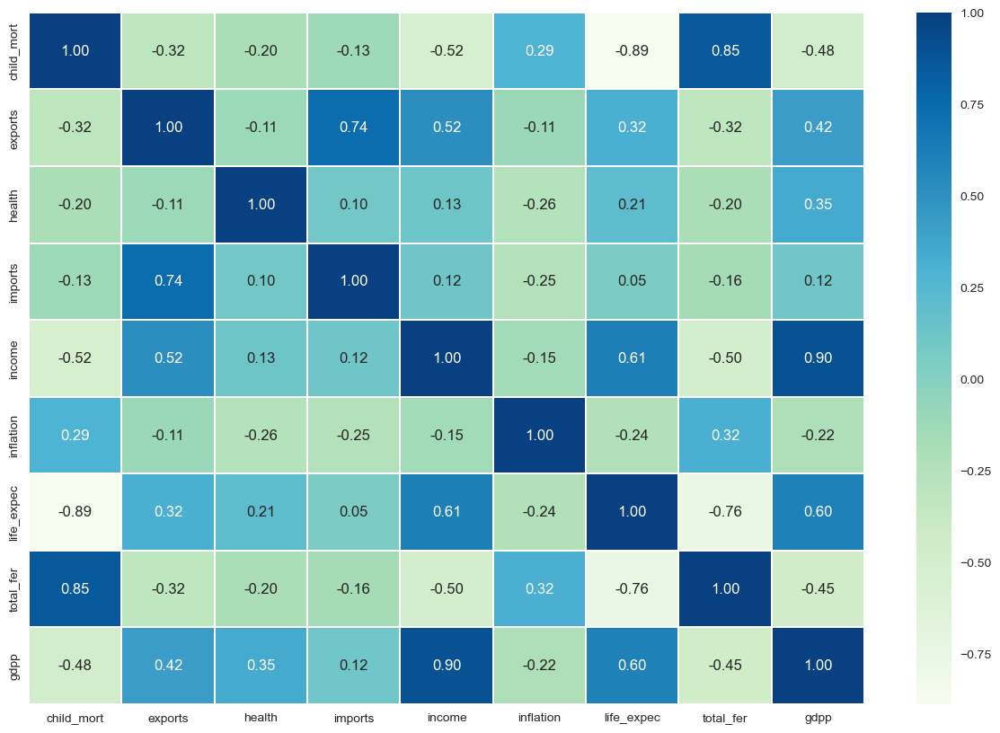

In [9]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_numerical.corr(), annot = True, cmap = 'GnBu', fmt='.2f', linewidths=0.2)
plt.show()

In [10]:
# Top 5 and Bottom 5 countries of each Category
def get5(col,return_df=False,place='Top'):
    
    c5 = df[['country',col]].sort_values(by=col,ascending=False)
    if place=='Top':
        c5 = c5.head()
    elif place=='Bottom':
        c5 = c5.tail()
    else:
        raise ValueError('place can be "Top" or "Bottom"')
    plt.figure(figsize=(7,7))
    plt.title(f'{place} 5 countries in {col} category')
    sns.barplot(data=c5,y='country',x=col)
    
    plt.show()
    if return_df:
        return top5

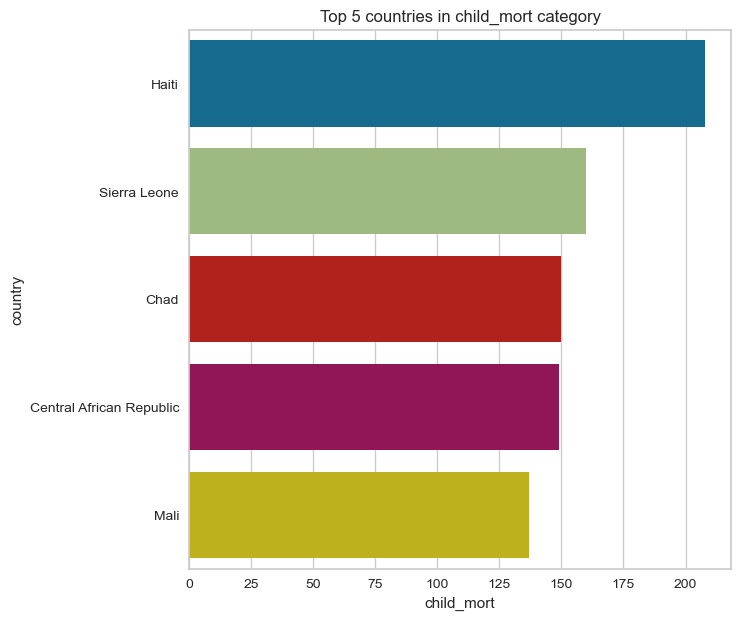

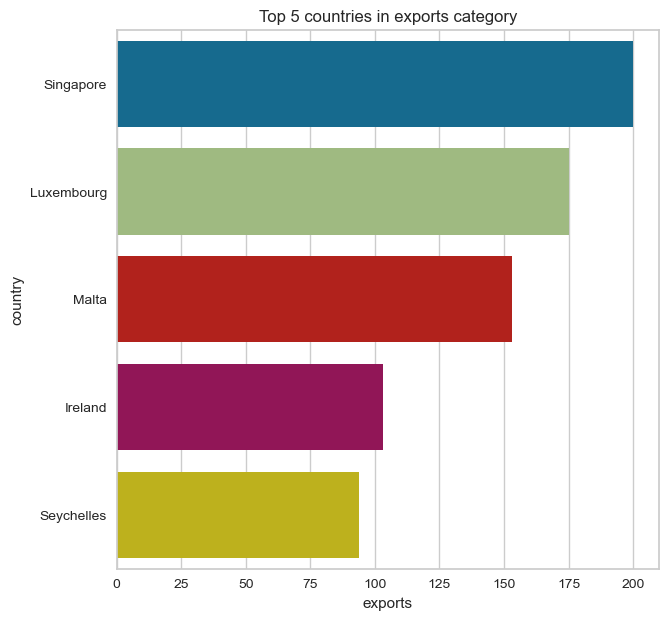

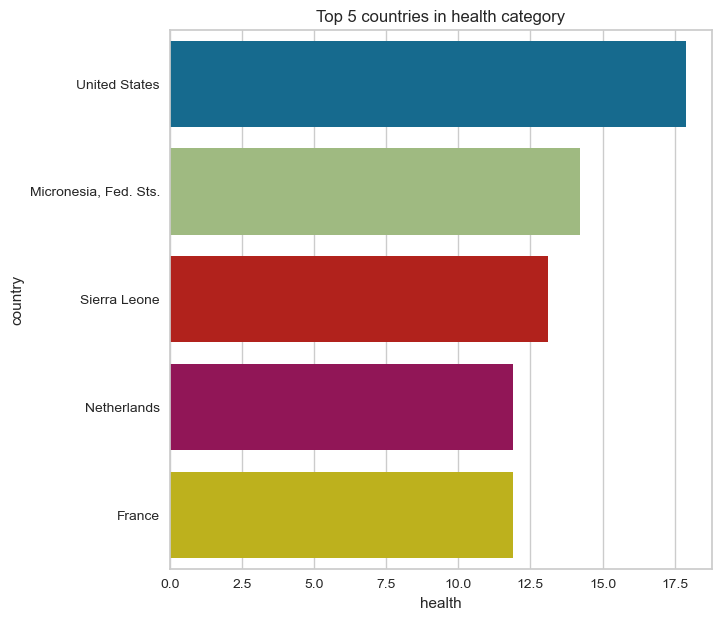

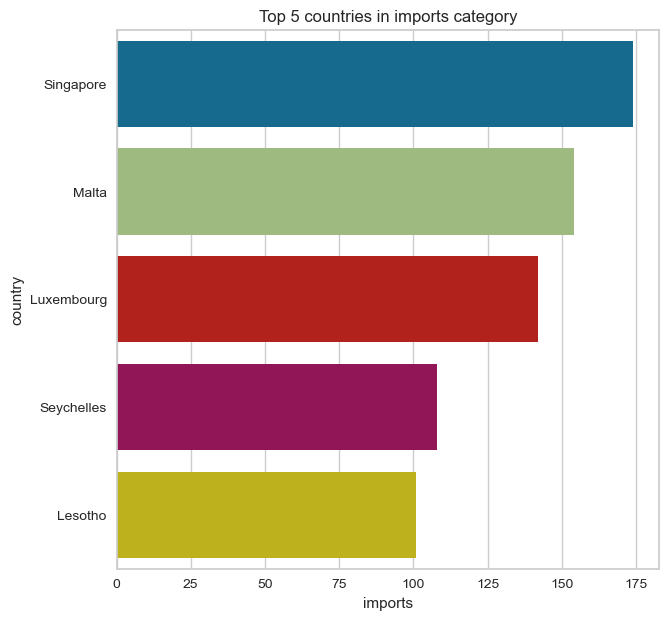

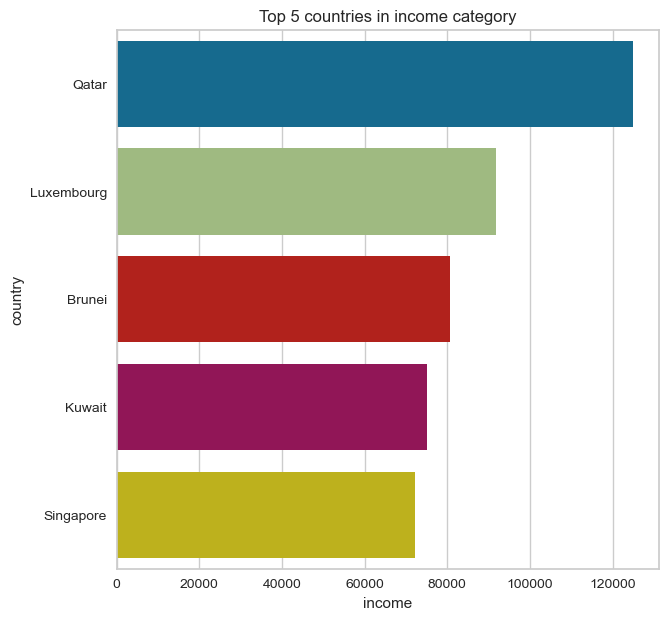

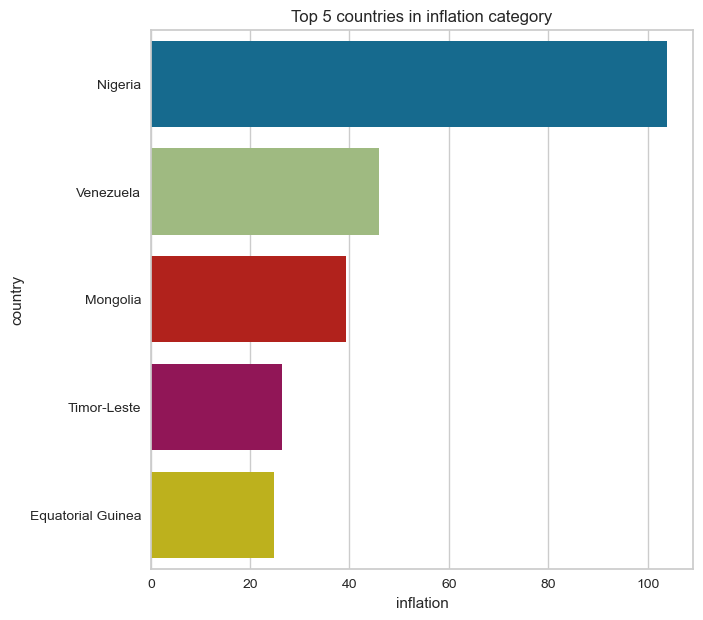

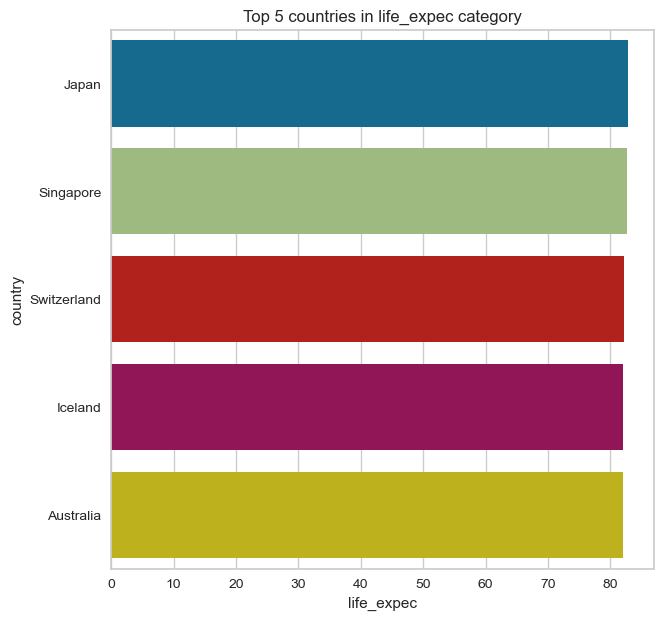

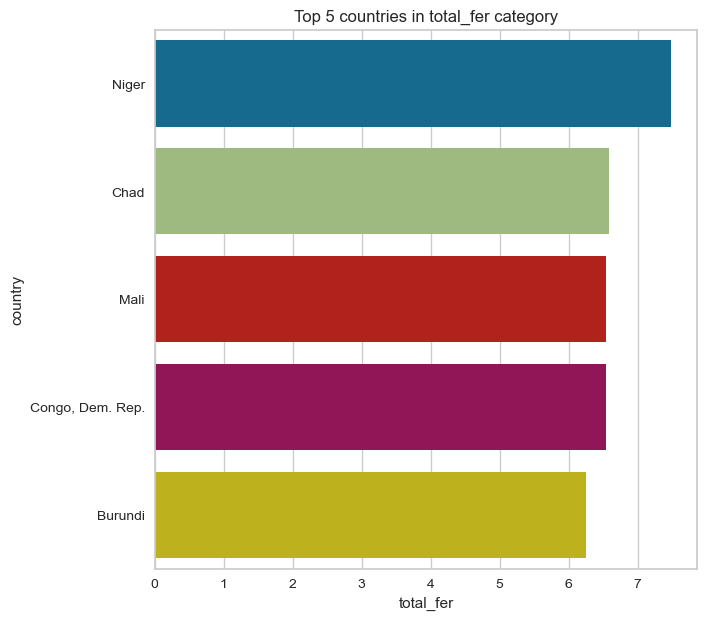

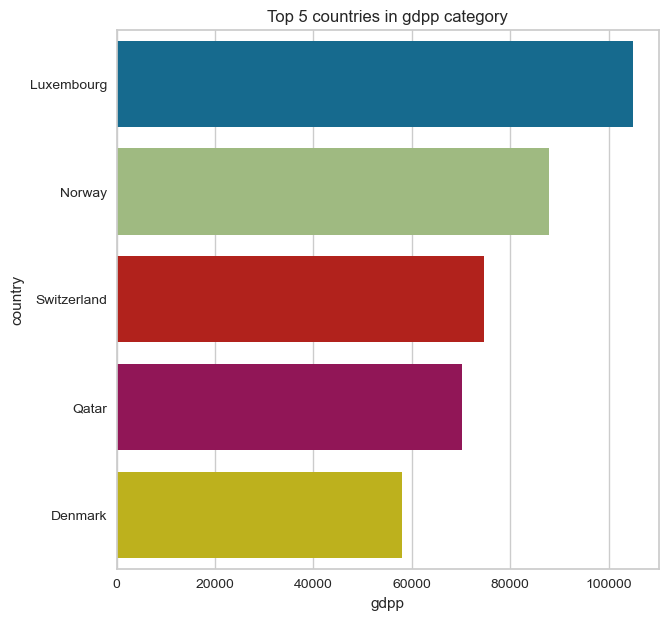

In [11]:
# Top 5 countries of each Category
for col in df.columns[1:]:
    get5(col)
    print('\n')

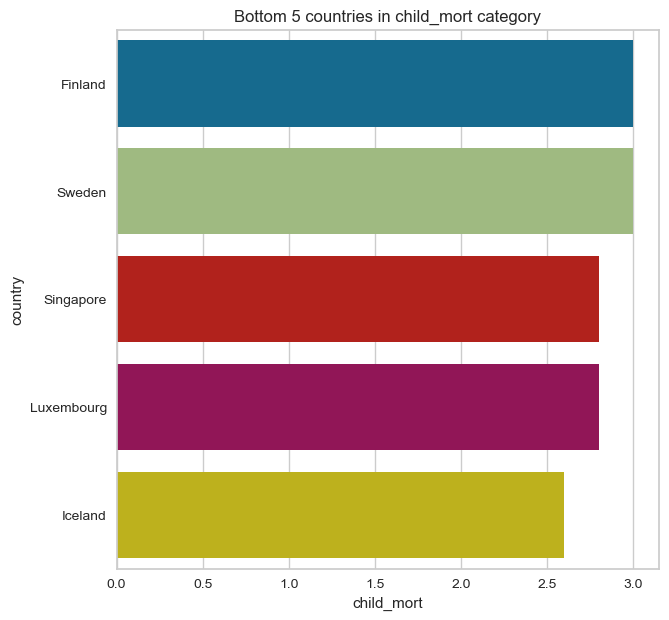

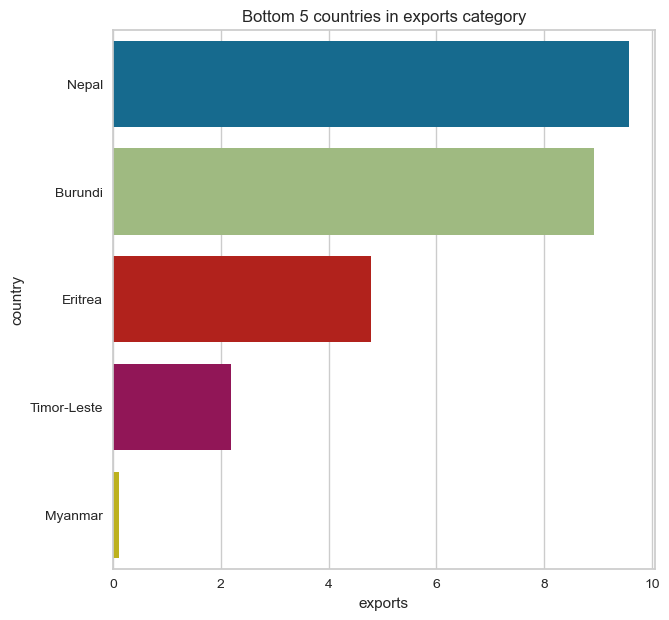

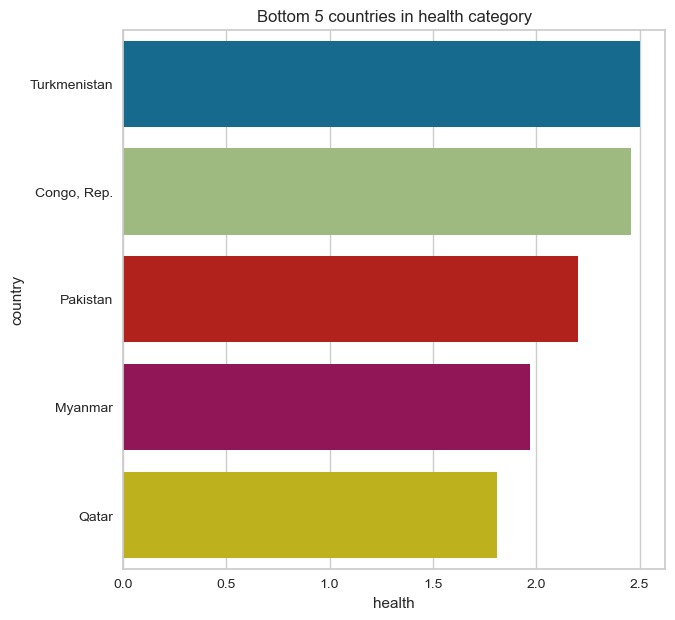

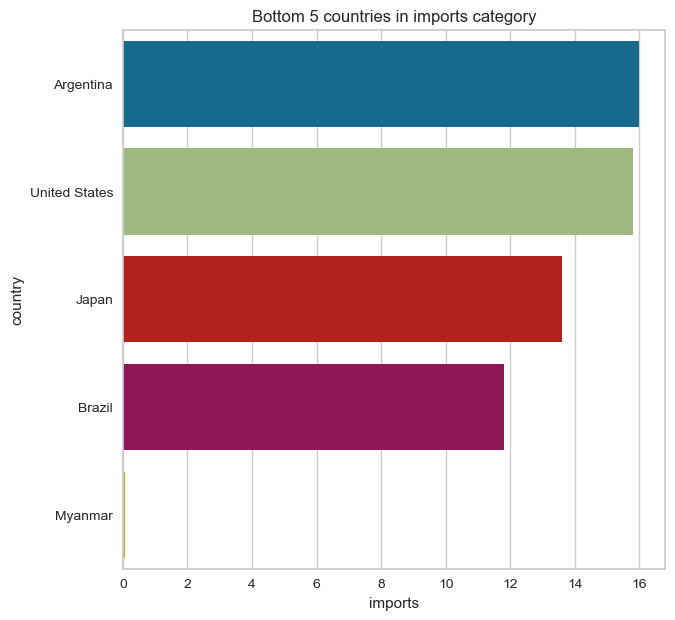

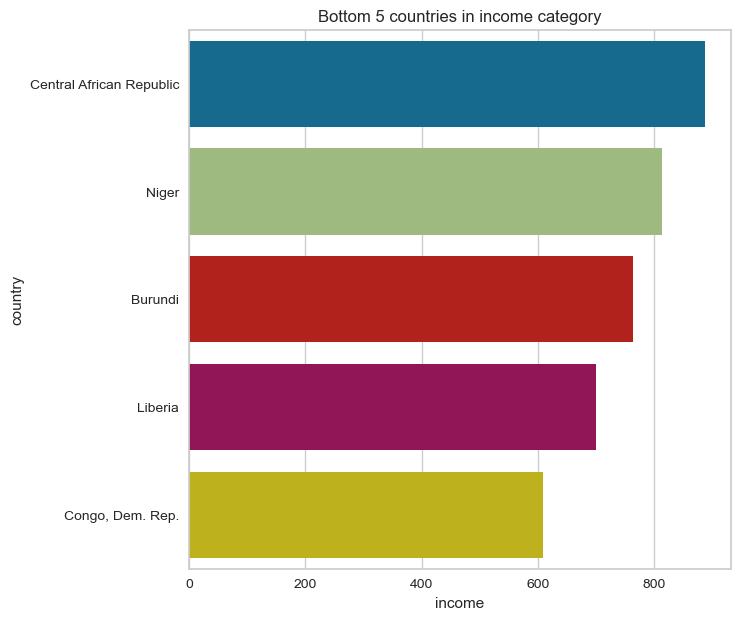

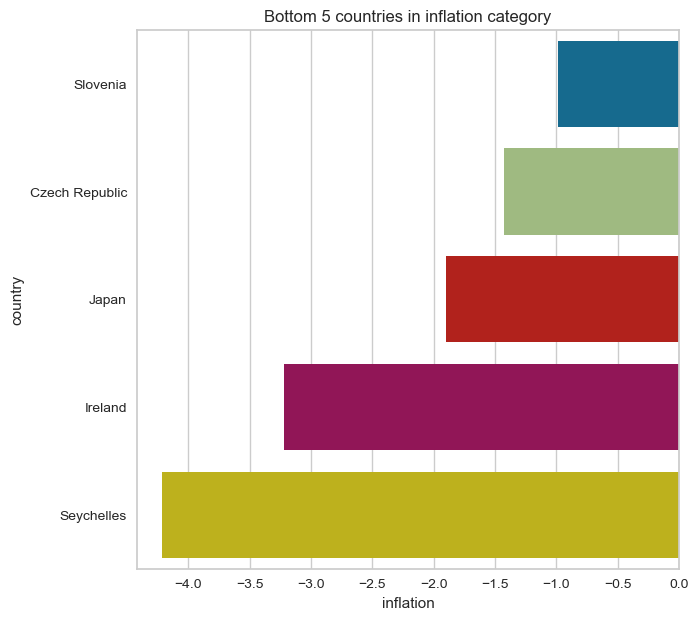

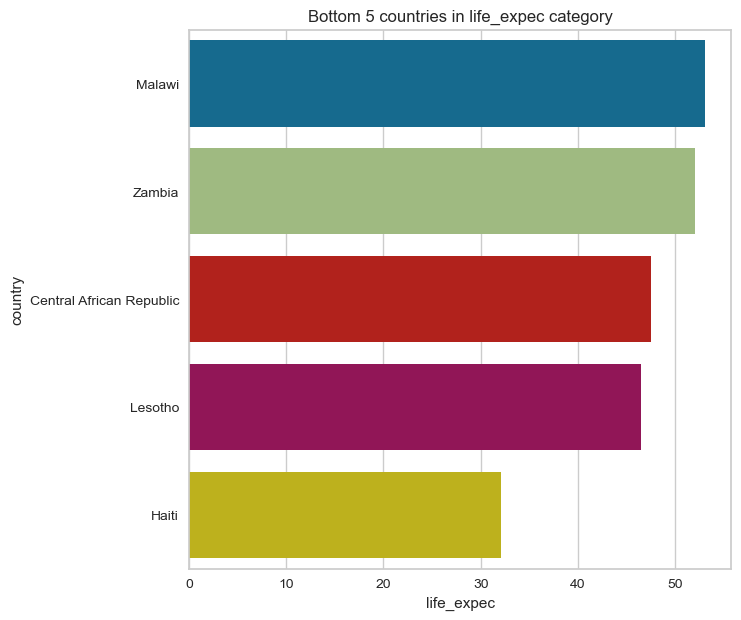

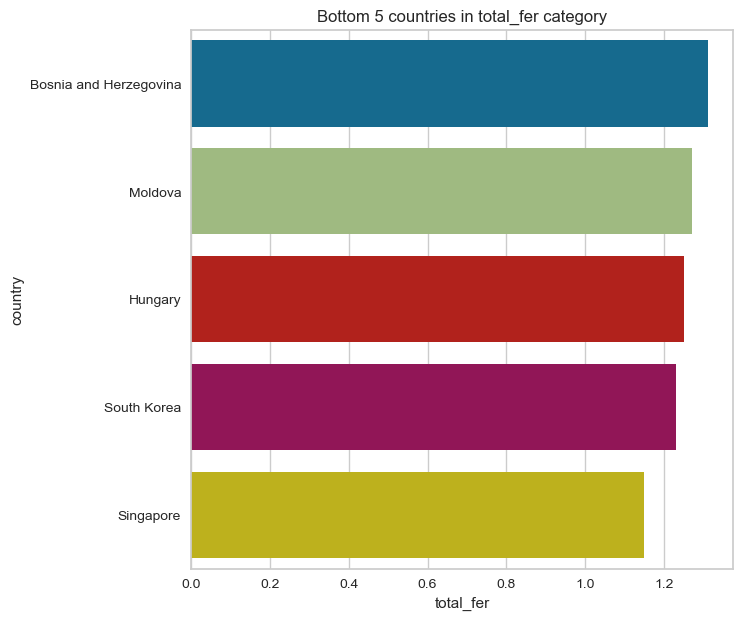

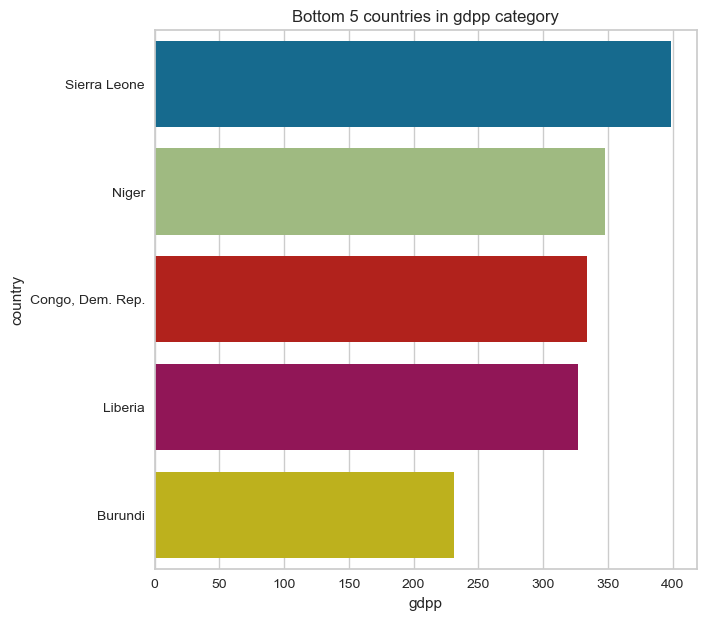

In [12]:
# Bottom 5 countries of each Category
for col in df.columns[1:]:
    get5(col,place='Bottom')
    print('\n')

In [13]:
# GDP per country
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='gdpp',
                    title='Coutries by gdpp'
                   )
fig.show()

In [14]:
# Death of children under 5 years of age per 1000 live births
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='child_mort',
                    title='Coutries by child_mort'
                   )
fig.show()

In [15]:
# Net income per person
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='income',
                    title='Coutries by income'
                   )
fig.show()

In [16]:
#Exports of goods and services per capita
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='exports',
                    title='Coutries by exports'
                   )
fig.show()

In [17]:
#Imports of goods and services per capita
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='imports',
                    title='Coutries by imports'
                   )
fig.show()

In [18]:
#Total health spending per capita
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='health',
                    title='Coutries by health'
                   )
fig.show()

In [19]:
#inflation
fig = px.choropleth(df,
                    locationmode='country names',
                    locations='country',
                    color='inflation',
                    title='Coutries by inflation'
                   )
fig.show()

<a class="anchor" id="About_Data"></a>
# <p style="padding:10px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Model Building</p> 

In [20]:
# Standardrizing data
df2= df.drop(columns = ['country'])
# instantiating the scaler
scaler = StandardScaler()

# fit and transform
df_scale = scaler.fit_transform(df2)
df_scale.shape

(167, 9)

In [21]:
df_scale1 = pd.DataFrame(df_scale)
df_scale1.columns = ['child_mort', 'exports', 'health', 'imports', 'income','inflation', 'life_expec', 'total_fer', 'gdpp']
df_scale1.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817


## Principal componenet Analysis (PCA)

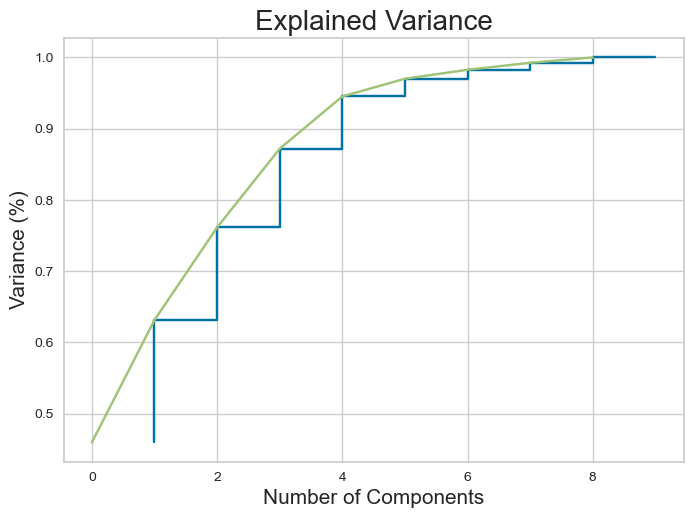

In [22]:
# pass through the scaled data set into our PCA class object
pca = PCA().fit(df_scale)

# plot the Cumulative Summation of the Explained Variance
plt.step(list(range(1,10)), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.cumsum(pca.explained_variance_ratio_))

# define the labels & title
plt.xlabel('Number of Components', fontsize = 15)
plt.ylabel('Variance (%)', fontsize = 15) 
plt.title('Explained Variance', fontsize = 20)

# show the plot
plt.show()

In [23]:
#Lets check if we will take 9 component then how much varience it explain. Ideally it should be 1 i.e 100%
sum(pca.explained_variance_ratio_)

1.0

In [24]:
var_ratio={}
for n in range(2,10):
    pca=PCA(n_components=n)
    pca_components = pca.fit(df_scale)
    var_ratio[n]=sum(pca.explained_variance_ratio_)

In [25]:
var_ratio

{2: 0.6313336543771411,
 3: 0.7613762433466718,
 4: 0.871907861402391,
 5: 0.9453099756439514,
 6: 0.9701523224082288,
 7: 0.982756626389879,
 8: 0.9925694437691406,
 9: 1.0}

In [26]:
# we will choose 5 pca components and create a new dataset
final_pca = PCA(n_components=5).fit(df_scale)
reduced_cr=final_pca.fit_transform(df_scale)
# store it in a new data frame
country_pca= pd.DataFrame(data = reduced_cr, columns = ['principal component 1', 'principal component 2',
                                                        'principal component 3','principal component 4',
                                                        'principal component 5'])

country_pca.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475
3,-2.932423,1.695555,1.525044,0.839625,-0.273209
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007


In [27]:
col_list=df2.columns
col_list

Index(['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

In [28]:
pd.DataFrame(final_pca.components_.T, columns=['PC_' +str(i) for i in range(5)],index=col_list)

,PC_0,PC_1,PC_2,PC_3,PC_4
child_mort,-0.419519,0.192884,-0.029544,0.370653,-0.168970
exports,0.283897,0.613163,0.144761,0.003091,0.057616
health,0.150838,-0.243087,-0.596632,0.461897,0.518000
imports,0.161482,0.671821,-0.299927,-0.071907,0.255376
income,0.398441,0.022536,0.301548,0.392159,-0.247150
inflation,-0.193173,-0.008404,0.642520,0.150442,0.714869
life_expec,0.425839,-0.222707,0.113919,-0.203797,0.108220
total_fer,-0.403729,0.155233,0.019549,0.378304,-0.135262
gdpp,0.392645,-0.046022,0.122977,0.531995,-0.180167


In [29]:
# Factor Analysis : variance explained by each component- 
pd.Series(final_pca.explained_variance_ratio_,index=['PC_'+ str(i) for i in range(5)])

PC_0    0.459517
PC_1    0.171816
PC_2    0.130043
PC_3    0.110532
PC_4    0.073402
dtype: float64

## K-means

In [30]:
# Set the parameters for the KMeans algorithm
kmeans_params = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 1,
    "tol": 0.0001,
    "algorithm": "elkan",
    "verbose": 0
}

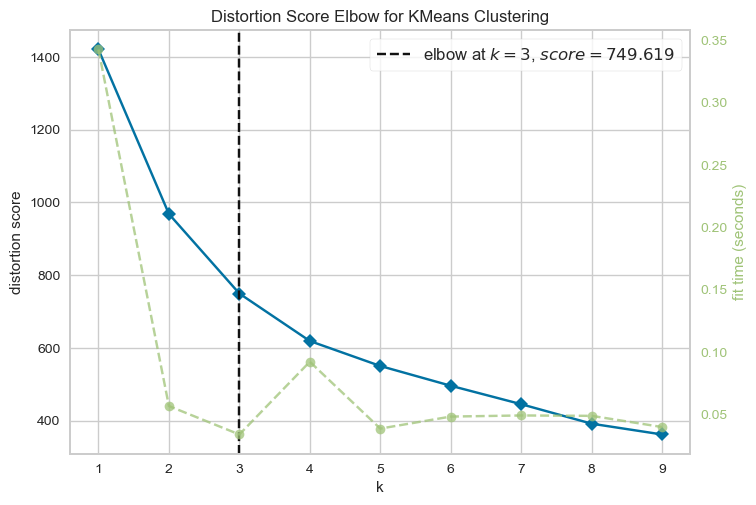

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [31]:
# Initialize KMeans model with the given parameters
k = (1, 10)
kmeans_model = KMeans(n_clusters=k, **kmeans_params)

# Create elbow plot visualizer with range of k values and timings enabled
elbow_visualizer = KElbowVisualizer(kmeans_model, k=k, timings=True)

# Fit the data to the visualizer
elbow_visualizer.fit(country_pca)

# Add a title to the elbow plot
elbow_visualizer.ax.set_title('Elbow Plot for KMeans Clustering')

# Finalize and render the figure
elbow_visualizer.show()

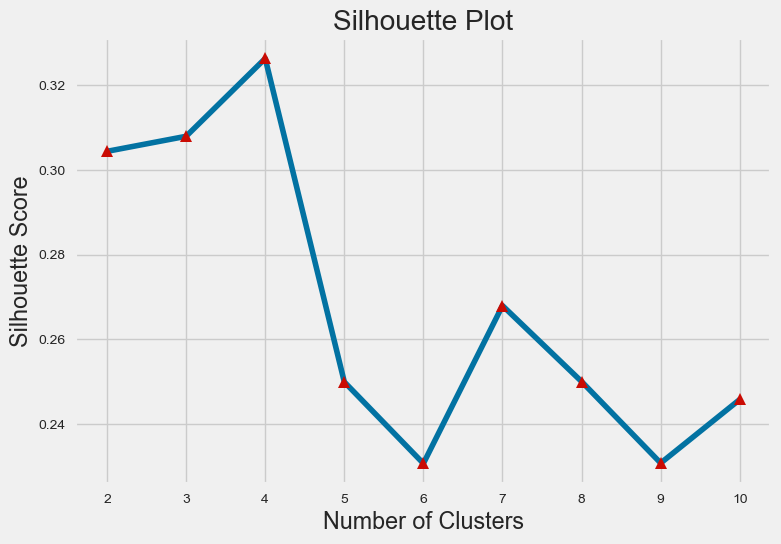

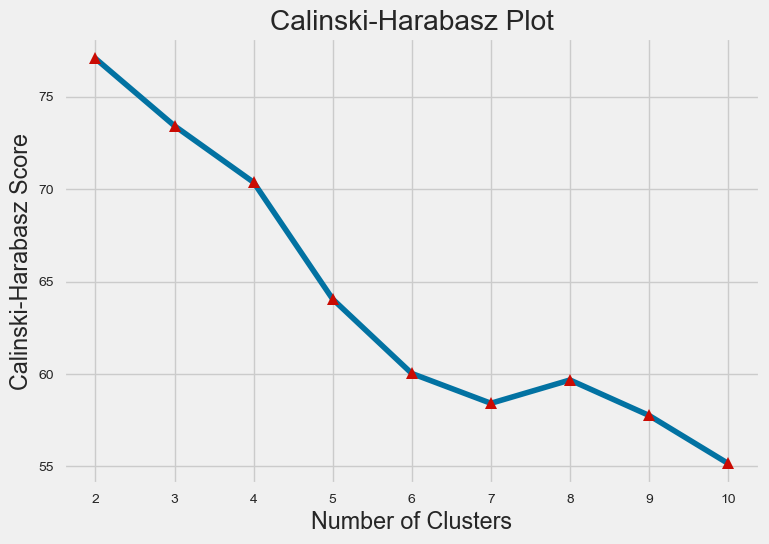

In [32]:
# Calculate silhouette score for different numbers of clusters
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init="random", random_state=1)
    labels = kmeans.fit_predict(country_pca)
    score = silhouette_score(country_pca, labels)
    silhouette_scores.append(score)

# Plot the silhouette scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), silhouette_scores, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Silhouette Score")
    ax.set_title("Silhouette Plot")
    plt.show()

# Calculate Calinski-Harabasz score for different numbers of clusters
calinski_harabaz = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init="random", random_state=1)
    kmeans.fit(country_pca)
    score = metrics.calinski_harabasz_score(country_pca, kmeans.labels_)
    calinski_harabaz.append(score)

# Plot the Calinski-Harabasz scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), calinski_harabaz, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Calinski-Harabasz Score")
    ax.set_title("Calinski-Harabasz Plot")
    plt.show()

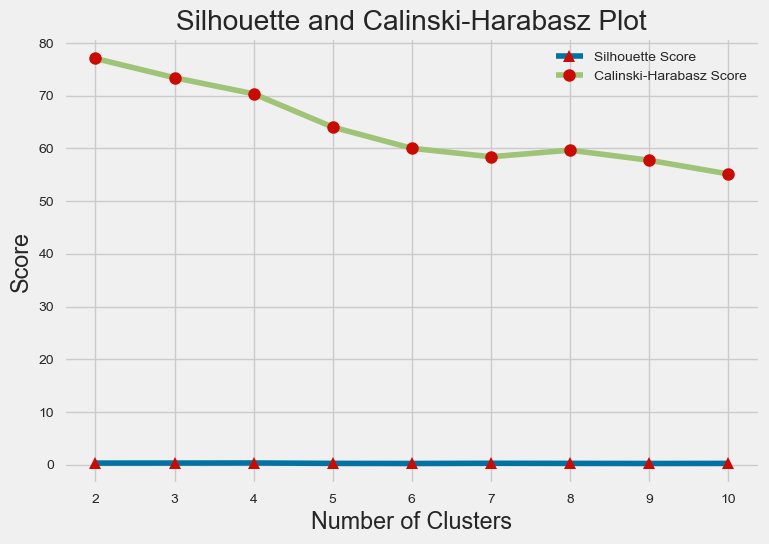

In [33]:
# Calculate silhouette and Calinski-Harabasz scores for different numbers of clusters (random)
silhouette_scores = []
calinski_harabaz_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init="random", random_state=1)
    labels = kmeans.fit_predict(country_pca)
    silhouette_score_k = silhouette_score(country_pca, labels)
    calinski_harabaz_score_k = calinski_harabasz_score(country_pca, labels)
    silhouette_scores.append(silhouette_score_k)
    calinski_harabaz_scores.append(calinski_harabaz_score_k)

#Create a dataframe to store the scores
scores_kmeans = pd.DataFrame({'k': range(2,11),
'Silhouette Score': silhouette_scores,
'Calinski-Harabasz Score': calinski_harabaz_scores})

#Find the best k for each score
best_k_silhouette = scores_kmeans.loc[scores_kmeans['Silhouette Score'].idxmax(), 'k']
best_k_calinski_harabaz = scores_kmeans.loc[scores_kmeans['Calinski-Harabasz Score'].idxmax(), 'k']
    
# Plot the scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(scores_kmeans['k'], scores_kmeans['Silhouette Score'], marker='^', c='b', ms=9, mfc='r', label='Silhouette Score')
    ax.plot(scores_kmeans['k'], scores_kmeans['Calinski-Harabasz Score'], marker='o', c='g', ms=9, mfc='r', label='Calinski-Harabasz Score')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Score")
    ax.set_title("Silhouette and Calinski-Harabasz Plot")
    ax.legend()
    plt.show()

In [34]:
print("\nScores for Different Numbers of Clusters:")
scores_kmeans


Scores for Different Numbers of Clusters:


,k,Silhouette Score,Calinski-Harabasz Score
0,2,0.304420,77.065351
1,3,0.307977,73.419864
2,4,0.326368,70.367591
3,5,0.249921,64.049004
4,6,0.230651,60.028090
5,7,0.267947,58.414548
6,8,0.250012,59.675216
7,9,0.230745,57.757180
8,10,0.245777,55.159568


In [35]:
# Best k for each score
print(f"\nBest k for Silhouette Score: {best_k_silhouette}")
print(f"Best k for Calinski-Harabasz Score: {best_k_calinski_harabaz}")


Best k for Silhouette Score: 4
Best k for Calinski-Harabasz Score: 2


In [36]:
# Hybrid Score to Find the Best k
def select_k(country_pca):
    silhouette_scores = []
    calinski_scores = []
    k_values = range(2, 11)

    for k in k_values:
        # Perform clustering using KMeans algorithm
        kmeans = KMeans(n_clusters=k, init="random", random_state=1)
        labels = kmeans.fit_predict(country_pca)

        # Calculate Silhouette Score
        silhouette_scores.append(silhouette_score(country_pca, labels))

        # Calculate Calinski-Harabasz Score
        calinski_scores.append(calinski_harabasz_score(country_pca, labels))

    hybrid_scores = np.sqrt(np.multiply(silhouette_scores, calinski_scores))
    best_k = k_values[np.argmax(hybrid_scores)]
    return best_k

best_k = select_k(country_pca)
print("\nBest value of k:", best_k)


Best value of k: 2


In [37]:
# Implement k-means with the Best Number of Clusters
kmeans = KMeans(n_clusters=2, **kmeans_params).fit(country_pca)

# Get the coordinates of the centroids of the three clusters
centroids = kmeans.cluster_centers_

centroids_scaled_col = pd.DataFrame(centroids, columns=country_pca.columns)
centroids_scaled_col

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-1.943513,0.289343,-0.053737,0.266649,-0.091853
1,1.334938,-0.198741,0.036910,-0.183153,0.063091


In [38]:
# Get the cluster labels assigned to each data point by k-means
pred = kmeans.labels_

print(f"\nSilhouette Score: {silhouette_score(country_pca, pred):.2f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz_score(country_pca, pred):.2f}")


Silhouette Score: 0.30
Calinski-Harabasz Score: 77.07


In [39]:
# Addition of Cluster Column to the Data frame
clustered_df = pd.concat([df, pd.DataFrame(pred, columns=['Cluster'])], axis = 1)
clustered_df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


In [40]:
# Size of the Clusters
KM_cluster = clustered_df.groupby('Cluster').size().to_frame()
KM_cluster.columns = ["k-means Size"]
KM_cluster

,k-means Size
Cluster,
0,68
1,99


In [102]:
df_kmeans=df.copy()

In [103]:
df_kmeans['cluster'] = kmeans.labels_

In [104]:
df_kmeans['cluster'].value_counts()

1    99
0    68
Name: cluster, dtype: int64

In [105]:
df_pair_plot=pd.DataFrame(reduced_cr,columns=['PC_' +str(i) for i in range(5)])

In [106]:
df_pair_plot['Cluster']= kmeans.labels_ #Add cluster column in the data frame

In [107]:
df_pair_plot.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,Cluster
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,0
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,1
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,1
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,0
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,1


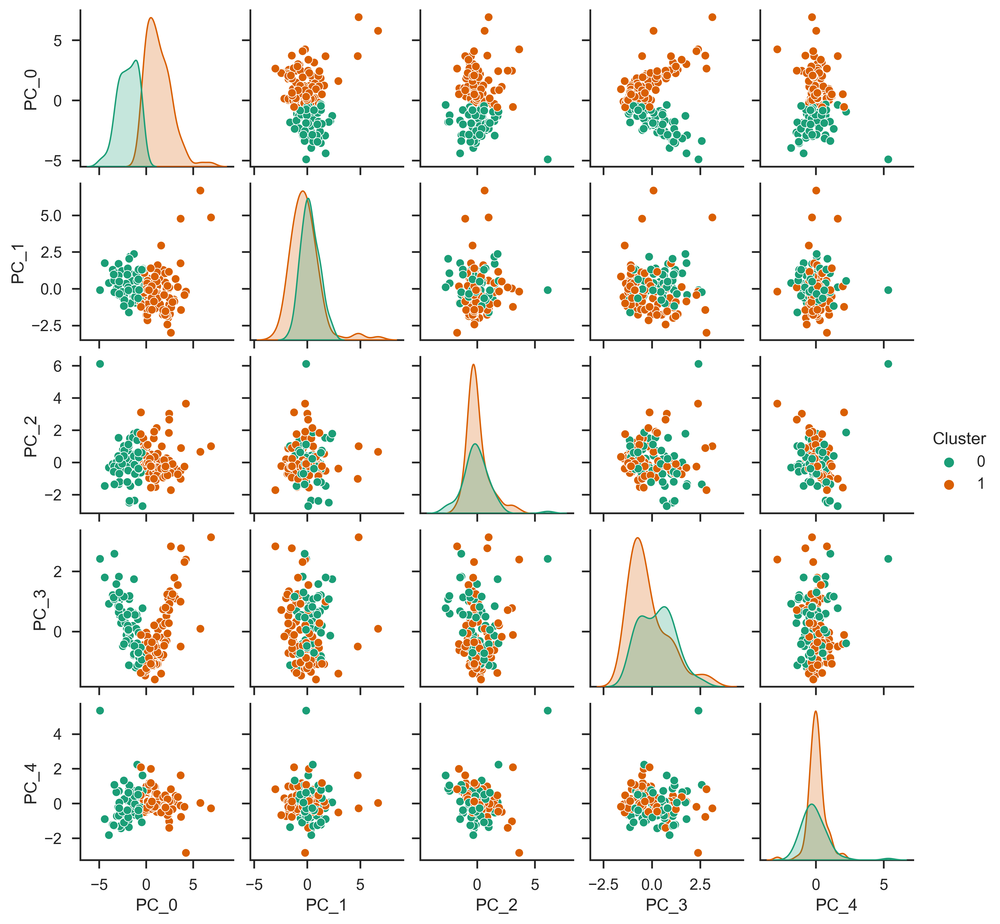

In [108]:
#pairwise relationship of components on the data
sns.pairplot(df_pair_plot,hue='Cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [109]:
df_kmeans['cluster'].loc[df_kmeans['cluster'] == 0] = 'Help Needed'
df_kmeans['cluster'].loc[df_kmeans['cluster'] == 1] = 'Might Need Help'
df_kmeans['cluster'].loc[df_kmeans['cluster'] == 2] = 'No Help Needed'

fig = px.choropleth(df_kmeans[['country','cluster']],
                    locationmode = 'country names',
                    locations = 'country',
                    title = 'Needed Help Per Country',
                    color = df_kmeans['cluster'],  
                    color_discrete_map = {'Help Needed':'Red',
                                        
                                        'Might Need Help':'Yellow',
                                         'No Help Needed':'Green'}
                   )
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

### Feature Importance

In [41]:
# X and y Arrays
X = clustered_df.drop(['Cluster', 'country'], axis =1)
y = clustered_df['Cluster']

In [42]:
print ('X:', X.shape,'\ny:', y.shape)

X: (167, 9) 
y: (167,)


In [43]:
# Split X and y into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [44]:
# check the shape of X_train, X_test, y_train and y_test
print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)

X_train shape: (133, 9)
X_test shape: (34, 9)
y_train shape: (133,)
y_test shape: (34,)


In [45]:
# Train Various Models
clf1 = RandomForestClassifier()
clf2 = DecisionTreeClassifier()
clf3 = AdaBoostClassifier()
clf4 = GradientBoostingClassifier()
clf5 = xg.XGBClassifier()

# Fit classifiers and predict response for test dataset
models = [('Random Forest', clf1), ('Decision Tree', clf2), ('AdaBoost', clf3), ('Gradient Boosting', clf4), ('XGBoost', clf5)]
y_preds = []
for name, clf in models:
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_preds.append(y_pred)
    
# Compute accuracy scores and store in a DataFrame
Accuracy = ['Accuracy Score']
results = pd.DataFrame(index=Accuracy)
for i, (name, _) in enumerate(models):
    score = accuracy_score(y_test, y_preds[i])
    results[name] = [score]

# Find the best score
best_score = results.max(axis=1).iloc[0]
best_col = results.idxmax(axis=1).iloc[0]
results

,Random Forest,Decision Tree,AdaBoost,Gradient Boosting,XGBoost
Accuracy Score,0.970588,0.941176,0.970588,0.941176,0.970588


## Hierarchical Clustering

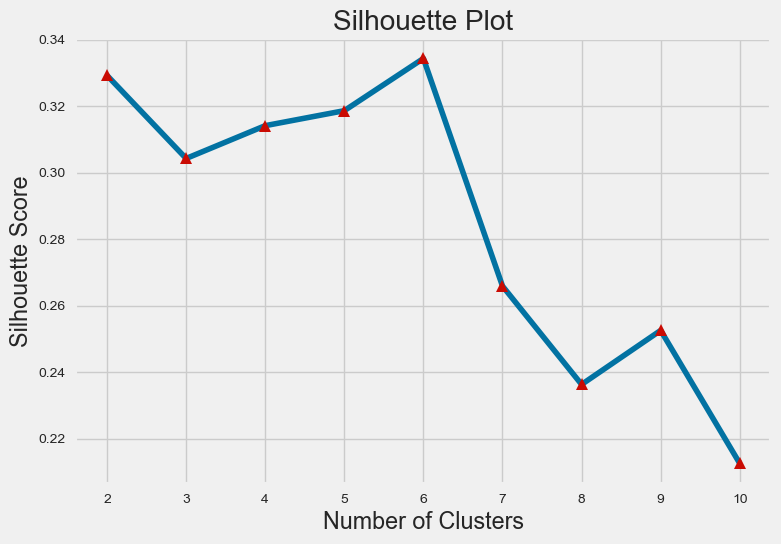

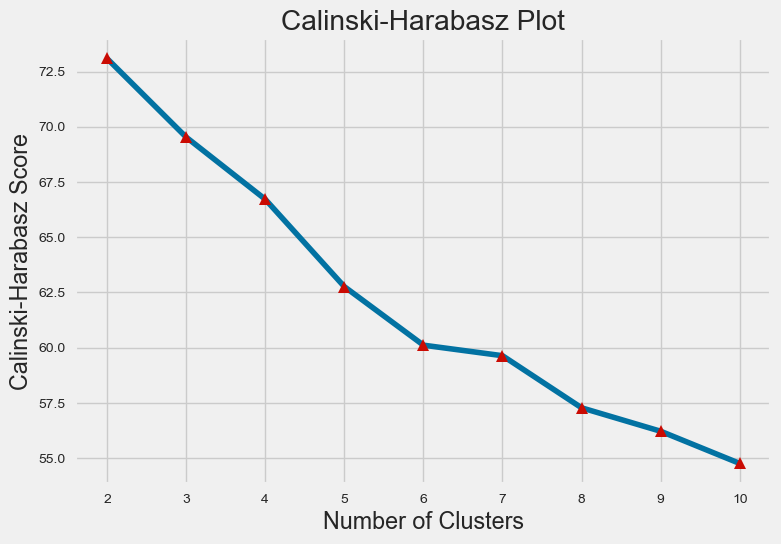

In [46]:
# Calculate silhouette score for different numbers of clusters
silhouette_scores = []
for n_clust in range(2, 11):
    AgglomerativeC = AgglomerativeClustering(n_clusters=n_clust, metric='euclidean', linkage='ward')
    labels = AgglomerativeC.fit_predict(country_pca)
    score = silhouette_score(country_pca, labels)
    silhouette_scores.append(score)

# Plot the silhouette scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), silhouette_scores, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Silhouette Score")
    ax.set_title("Silhouette Plot")
    plt.show()

# Calculate Calinski-Harabasz score for different numbers of clusters
calinski_harabaz = []
for n_clust in range(2, 11):
    AgglomerativeC = AgglomerativeClustering(n_clusters=n_clust, metric='euclidean', linkage='ward')
    AgglomerativeC.fit(country_pca)
    score = metrics.calinski_harabasz_score(country_pca, AgglomerativeC.labels_)
    calinski_harabaz.append(score)

# Plot the Calinski-Harabasz scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), calinski_harabaz, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Calinski-Harabasz Score")
    ax.set_title("Calinski-Harabasz Plot")
    plt.show()

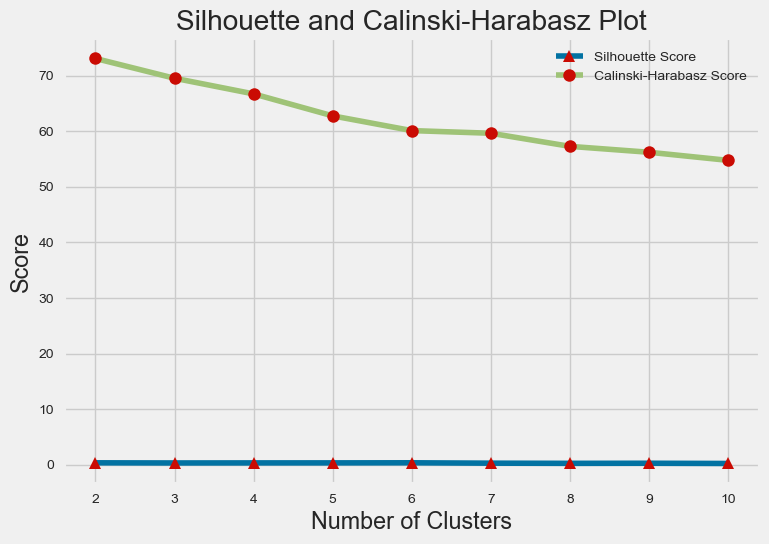

In [47]:
# Calculate silhouette and Calinski-Harabasz scores for different numbers of clusters
silhouette_scores = []
calinski_harabaz_scores = []
for k in range(2, 11):
    AgglomerativeC = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
    labels = AgglomerativeC.fit_predict(country_pca)
    silhouette_score_k = silhouette_score(country_pca, labels)
    calinski_harabaz_score_k = calinski_harabasz_score(country_pca, labels)
    silhouette_scores.append(silhouette_score_k)
    calinski_harabaz_scores.append(calinski_harabaz_score_k)

#Create a dataframe to store the scores
scores_Agg = pd.DataFrame({'k': range(2,11),
'Silhouette Score': silhouette_scores,
'Calinski-Harabasz Score': calinski_harabaz_scores})

#Find the best k for each score
best_k_silhouette = scores_Agg.loc[scores_Agg['Silhouette Score'].idxmax(), 'k']
best_k_calinski_harabaz = scores_Agg.loc[scores_Agg['Calinski-Harabasz Score'].idxmax(), 'k']
    
# Plot the scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(scores_Agg['k'], scores_Agg['Silhouette Score'], marker='^', c='b', ms=9, mfc='r', label='Silhouette Score')
    ax.plot(scores_Agg['k'], scores_Agg['Calinski-Harabasz Score'], marker='o', c='g', ms=9, mfc='r', label='Calinski-Harabasz Score')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Score")
    ax.set_title("Silhouette and Calinski-Harabasz Plot")
    ax.legend()
    plt.show()

In [48]:
print("\nScores for Different Numbers of Clusters:")
scores_Agg


Scores for Different Numbers of Clusters:


,k,Silhouette Score,Calinski-Harabasz Score
0,2,0.329243,73.092769
1,3,0.304272,69.531418
2,4,0.314134,66.719057
3,5,0.318641,62.763843
4,6,0.334331,60.113529
5,7,0.265922,59.635616
6,8,0.236348,57.277089
7,9,0.252590,56.215474
8,10,0.212596,54.757349


In [49]:
# Best k for each score
print(f"\nBest k for Silhouette Score: {best_k_silhouette}")
print(f"Best k for Calinski-Harabasz Score: {best_k_calinski_harabaz}")


Best k for Silhouette Score: 6
Best k for Calinski-Harabasz Score: 2


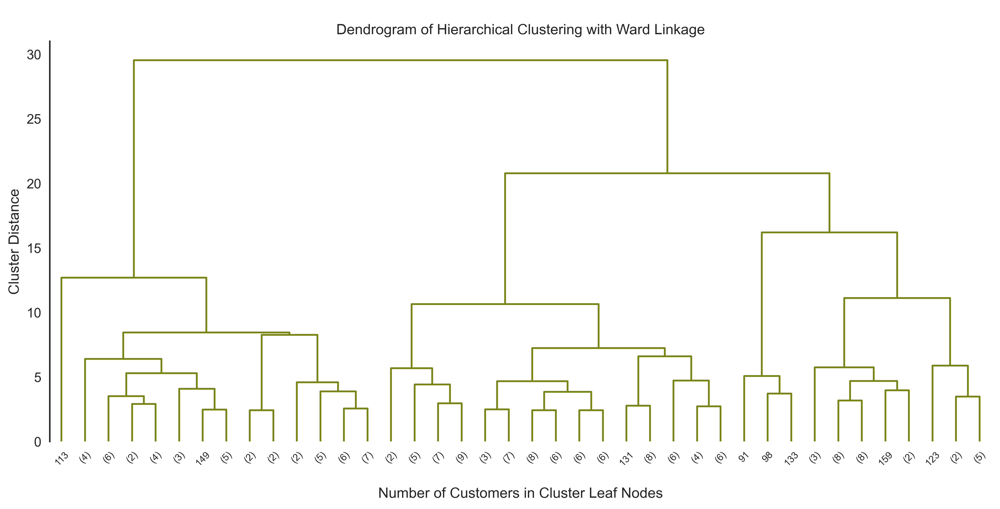

In [50]:
# Ward linkage
sns.set(rc={'figure.dpi':400})
sns.set_context('notebook')
sns.set_style('ticks')

Z = hierarchy.linkage(country_pca, method='ward', metric='euclidean')
fig, ax = plt.subplots(figsize=(14,6))
hierarchy.set_link_color_palette(["#798517", "#D5D68A", "#D72A2B"])
den = hierarchy.dendrogram(Z, orientation='top', color_threshold=102, p=40, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax,
                           above_threshold_color='grey')
ax.axhline(101, color='grey', linestyle='--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both', length=0)
ax.set_xlabel('\nNumber of Customers in Cluster Leaf Nodes')
ax.set_ylabel('Cluster Distance')
ax.set_title('\nDendrogram of Hierarchical Clustering with Ward Linkage')
fig.show()

In [51]:
# Implement Agglomerative Clustering with the Best Number of Clusters
hc = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward').fit(country_pca)

cluster_labels = hc.labels_

centroids = np.zeros((2, country_pca.shape[1]))
for i in range(2):
    cluster_i = country_pca[cluster_labels == i]
    centroids[i,:] = cluster_i.mean(axis=0)

centroids_scaled_col = pd.DataFrame(centroids, columns=country_pca.columns)
centroids_scaled_col

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,1.003859,-0.163432,0.063706,-0.274502,0.048108
1,-2.349029,0.382431,-0.149073,0.642335,-0.112572


In [52]:
# Get the cluster labels assigned to each data point by Agglomerative clustering
pred_hc = hc.labels_

print(f"\nSilhouette Score: {silhouette_score(country_pca, pred_hc):.2f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz_score(country_pca, pred_hc):.2f}")


Silhouette Score: 0.33
Calinski-Harabasz Score: 73.09


In [53]:
hc_scaled_df = pd.concat([df, pd.DataFrame(pred_hc, columns=['hc Cluster'])], axis = 1)
hc_scaled_df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,hc Cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1


In [54]:
HC_cluster = hc_scaled_df.groupby('hc Cluster').size().to_frame()
HC_cluster.columns = ["Agglomerative Size"]
HC_cluster

,Agglomerative Size
hc Cluster,
0,117
1,50


In [118]:
df_hc = df.copy()

In [119]:
df_hc['cluster'] = hc.labels_

In [120]:
df_hc['cluster'].value_counts()

0    117
1     50
Name: cluster, dtype: int64

In [121]:
df_pair_plothc=pd.DataFrame(reduced_cr,columns=['PC_' +str(i) for i in range(5)])

In [122]:
df_pair_plothc['Cluster']= kmeans.labels_ #Add cluster column in the data frame

In [123]:
df_pair_plothc.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,Cluster
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,0
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,1
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,1
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,0
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,1


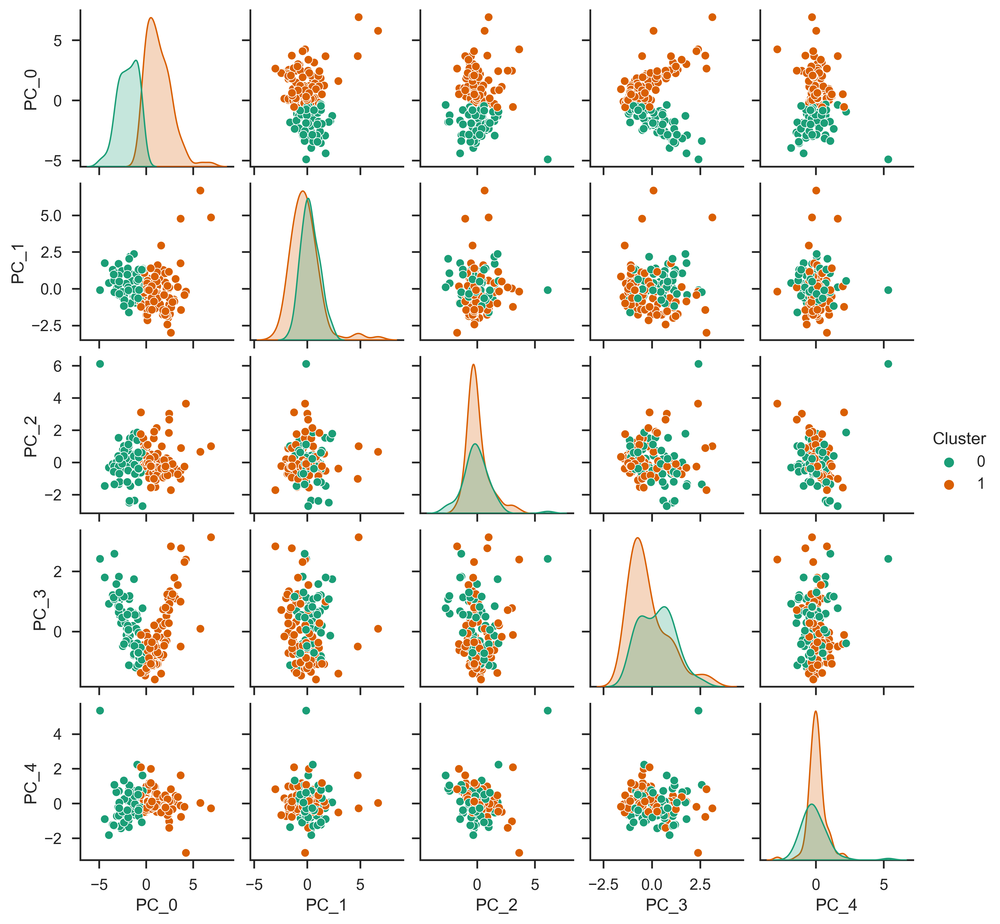

In [124]:
#pairwise relationship of components on the data
sns.pairplot(df_pair_plothc,hue='Cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [125]:
df_hc['cluster'].loc[df_hc['cluster'] == 0] = 'Help Needed'
df_hc['cluster'].loc[df_hc['cluster'] == 1] = 'Might Need Help'
df_hc['cluster'].loc[df_hc['cluster'] == 2] = 'No Help Needed'

fig = px.choropleth(df_kmeans[['country','cluster']],
                    locationmode = 'country names',
                    locations = 'country',
                    title = 'Needed Help Per Country',
                    color = df_hc['cluster'],  
                    color_discrete_map = {'Help Needed':'Red',
                                        
                                        'Might Need Help':'Yellow',
                                         'No Help Needed':'Green'}
                   )
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

## Gaussian Mixture

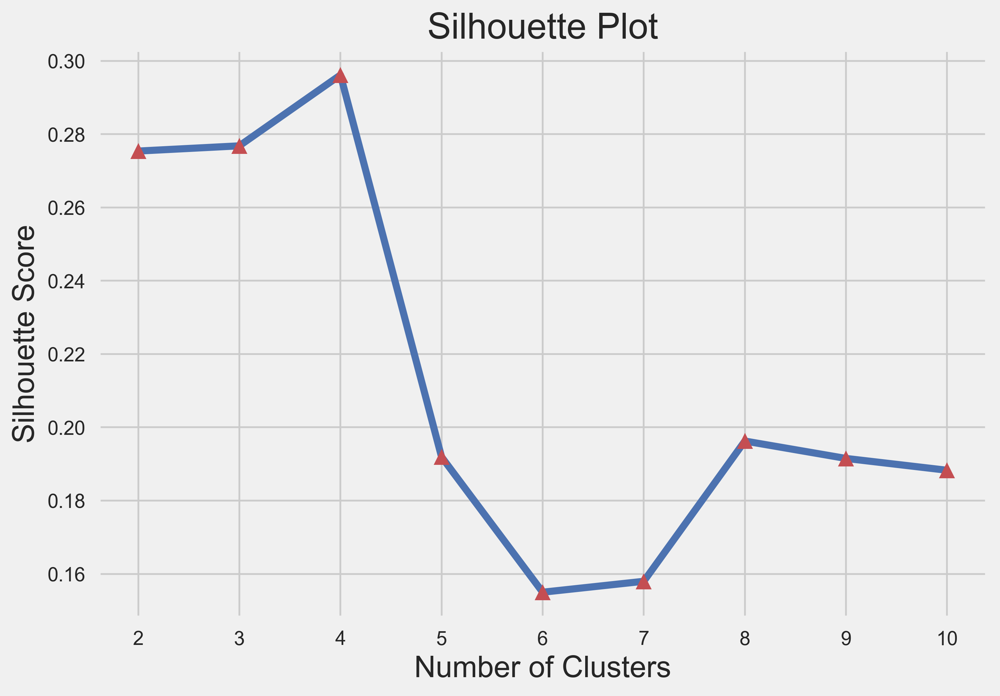

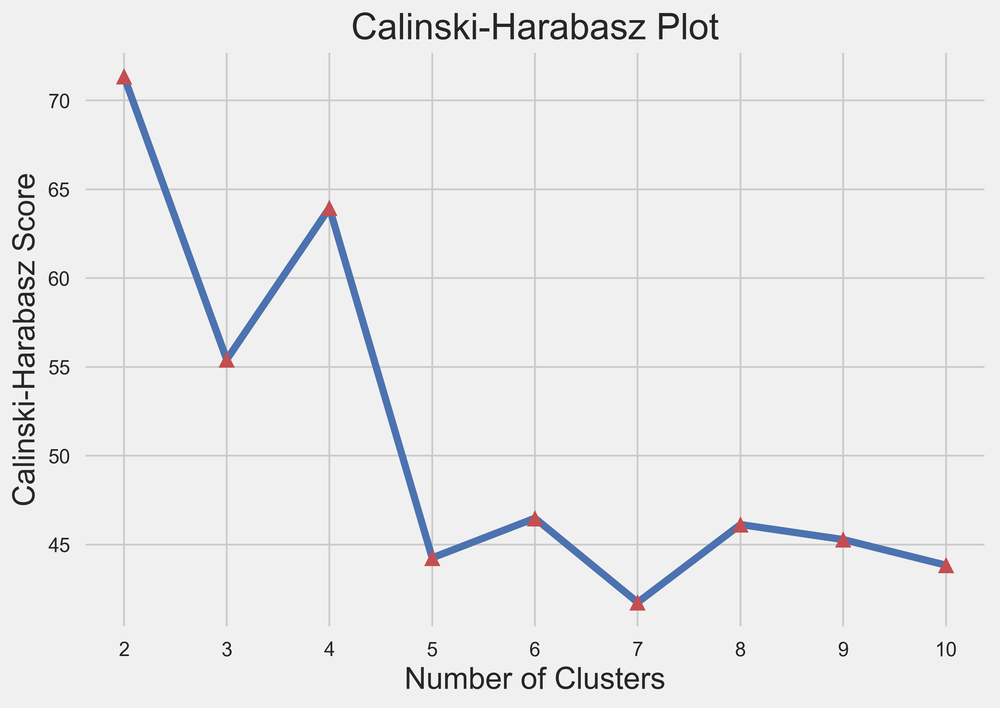

In [55]:
# Calculate silhouette score for different numbers of components
silhouette_scores = []
for n_components in range(2, 11):
    # Fit GMM
    gmm = GaussianMixture(n_components=n_components, random_state=0) 
    labels = gmm.fit_predict(country_pca)
    score = silhouette_score(country_pca, labels)
    silhouette_scores.append(score)

# Plot the silhouette scores for different numbers of components
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), silhouette_scores, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Silhouette Score")
    ax.set_title("Silhouette Plot")
    plt.show()

# Calculate Calinski-Harabasz score for different numbers of components
calinski_harabaz = []
for n_components in range(2, 11):
    # Fit GMM
    gmm = GaussianMixture(n_components=n_components, random_state=0)
    gmm.fit(country_pca)
    score = calinski_harabasz_score(country_pca, gmm.predict(country_pca))
    calinski_harabaz.append(score)

# Plot the Calinski-Harabasz scores for different numbers of components
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), calinski_harabaz, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Calinski-Harabasz Score")
    ax.set_title("Calinski-Harabasz Plot")
    plt.show()

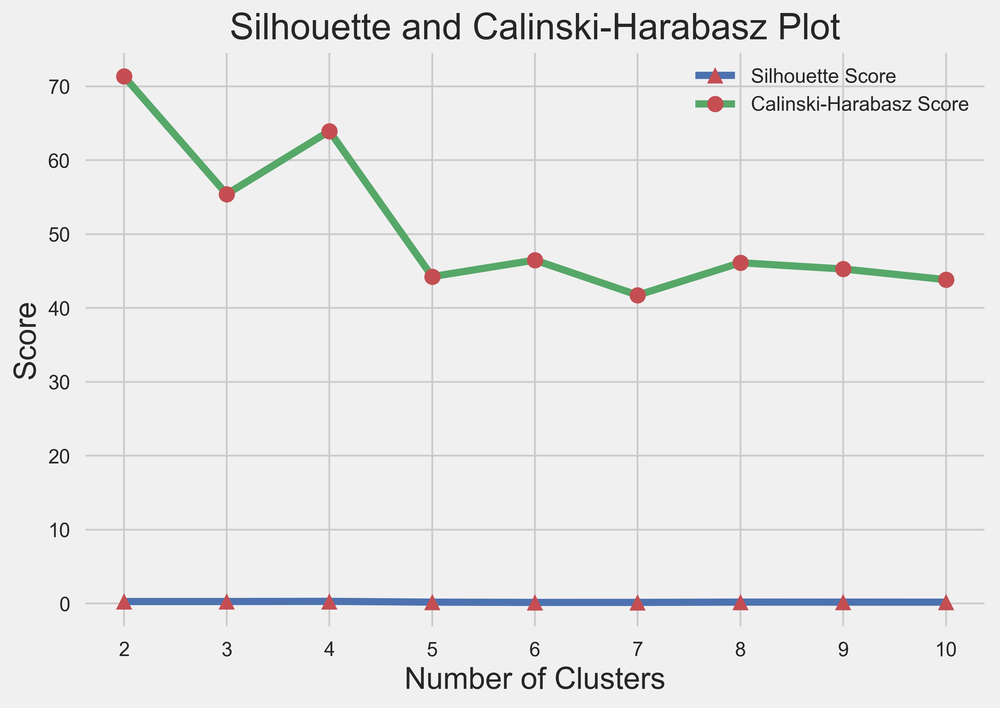

In [56]:
# Find the best 'k' for Silhouette and Calinski-Harabasz
silhouette_scores = []
calinski_harabaz_scores = []
for k in range(2, 11):
    gmm = GaussianMixture(n_components=k, random_state=0) 
    labels = gmm.fit_predict(country_pca)
    silhouette_score_k = silhouette_score(country_pca, labels)
    calinski_harabaz_score_k = calinski_harabasz_score(country_pca, labels)
    silhouette_scores.append(silhouette_score_k)
    calinski_harabaz_scores.append(calinski_harabaz_score_k)

#Create a dataframe to store the scores
scores_gmm = pd.DataFrame({'k': range(2,11),
'Silhouette Score': silhouette_scores,
'Calinski-Harabasz Score': calinski_harabaz_scores})

#Find the best k for each score
best_k_silhouette = scores_gmm.loc[scores_gmm['Silhouette Score'].idxmax(), 'k']
best_k_calinski_harabaz = scores_gmm.loc[scores_gmm['Calinski-Harabasz Score'].idxmax(), 'k']

#Plot the scores for different numbers of components
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(scores_gmm['k'], scores_gmm['Silhouette Score'], marker='^', c='b', ms=9, mfc='r', label='Silhouette Score')
    ax.plot(scores_gmm['k'], scores_gmm['Calinski-Harabasz Score'], marker='o', c='g', ms=9, mfc='r', label='Calinski-Harabasz Score')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Score")
    ax.set_title("Silhouette and Calinski-Harabasz Plot")
    ax.legend()
    plt.show()

In [57]:
print("\nScores for Different Numbers of Clusters:")
scores_gmm


Scores for Different Numbers of Clusters:


,k,Silhouette Score,Calinski-Harabasz Score
0,2,0.275379,71.360774
1,3,0.276800,55.412766
2,4,0.296133,63.948267
3,5,0.191918,44.251330
4,6,0.155002,46.482762
5,7,0.157979,41.742216
6,8,0.196250,46.126748
7,9,0.191505,45.281045
8,10,0.188279,43.839074


In [58]:
# Best k for each score
print(f"\nBest k for Silhouette Score: {best_k_silhouette}")
print(f"Best k for Calinski-Harabasz Score: {best_k_calinski_harabaz}")


Best k for Silhouette Score: 4
Best k for Calinski-Harabasz Score: 2


In [59]:
# Implement Gaussian Mixture with the Best Number of Components
gmm = GaussianMixture(n_components=2, random_state=0).fit(country_pca)

# Get the cluster labels assigned to each data point by GMM
cluster_labels = gmm.predict(country_pca)

# Get the coordinates of the centroids of the two clusters
centroids = np.zeros((2, country_pca.shape[1]))
for i in range(2):
    cluster_i = country_pca[cluster_labels == i]
    centroids[i,:] = cluster_i.mean(axis=0)

# Convert the centroids array to a DataFrame and assign column names
centroids_scaled_col = pd.DataFrame(centroids, columns=country_pca.columns)
centroids_scaled_col

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,1.805944,-0.204829,-0.018370,0.035048,-0.050908
1,-1.402488,0.159070,0.014266,-0.027218,0.039535


In [60]:
# Get the cluster labels assigned to each data point by GMM
pred_gmm = gmm.predict(country_pca)


print(f"\nBest k for Silhouette Score: {silhouette_score(country_pca, pred_gmm):.2f}")
print(f"Best k for Calinski-Harabasz Score: {calinski_harabasz_score(country_pca, pred_gmm):.2f}")


Best k for Silhouette Score: 0.28
Best k for Calinski-Harabasz Score: 71.36


In [61]:
# Addition of Cluster Column to the Data frame
gmm_scaled_df = pd.concat([df, pd.DataFrame(pred_gmm, columns=['GMM Cluster'])], axis = 1)
gmm_scaled_df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,GMM Cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1


In [62]:
GMM_cluster = gmm_scaled_df.groupby('GMM Cluster').size().to_frame()
GMM_cluster.columns = ["Gaussian Mixture Size"]
GMM_cluster

,Gaussian Mixture Size
GMM Cluster,
0,73
1,94


## Mini Batch K-means

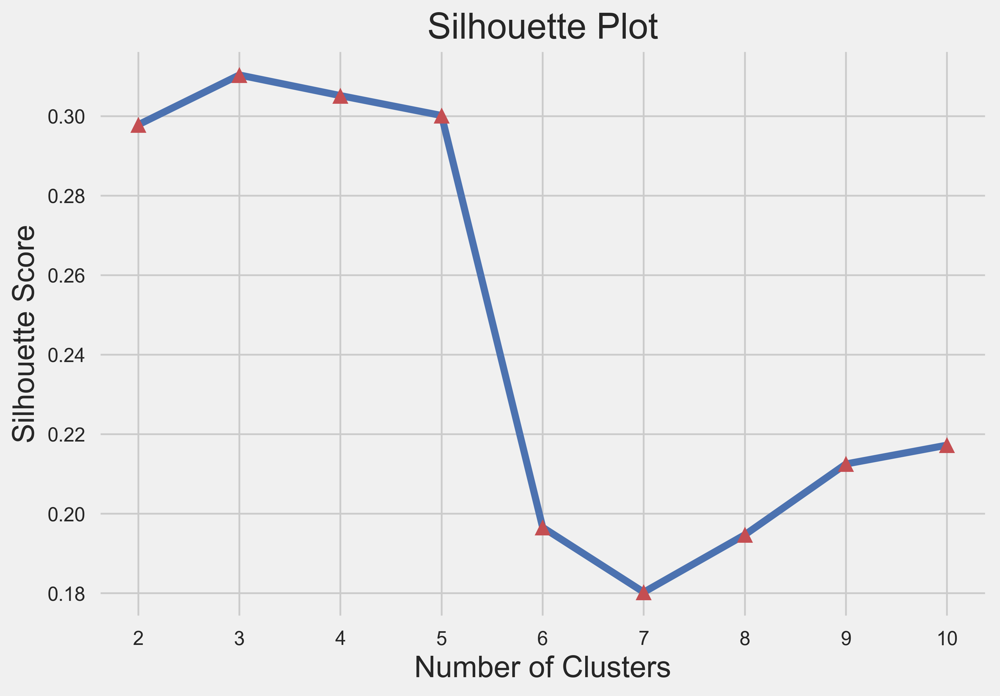

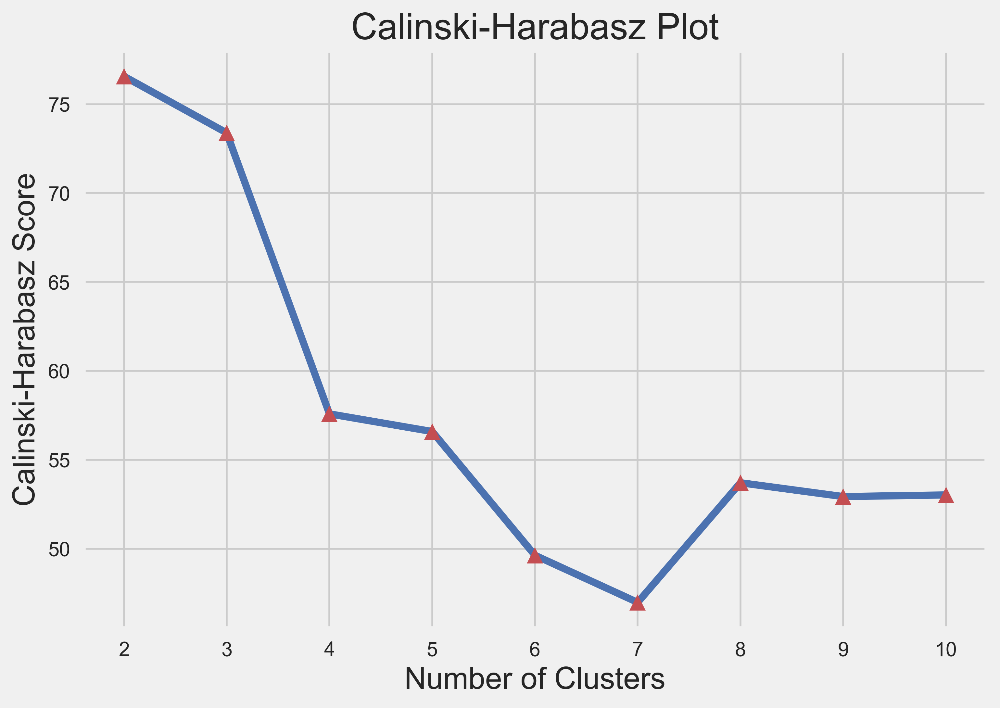

In [63]:
# Calculate silhouette score for different numbers of clusters
silhouette_scores = []
for k in range(2, 11):
    # Fit mbkmeans
    mbkmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    labels = mbkmeans.fit_predict(country_pca)
    score = silhouette_score(country_pca, labels)
    silhouette_scores.append(score)

# Plot the silhouette scores for different numbers of clusters
import matplotlib.pyplot as plt
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), silhouette_scores, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Silhouette Score")
    ax.set_title("Silhouette Plot")
    plt.show()

# Calculate Calinski-Harabasz score for different numbers of clusters
calinski_harabaz = []
for k in range(2, 11):
    # Fit mbkmeans
    mbkmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    mbkmeans.fit(country_pca)
    score = calinski_harabasz_score(country_pca, mbkmeans.predict(country_pca))
    calinski_harabaz.append(score)

# Plot the Calinski-Harabasz scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(range(2, 11), calinski_harabaz, marker='^', c='b', ms=9, mfc='r')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Calinski-Harabasz Score")
    ax.set_title("Calinski-Harabasz Plot")
    plt.show()

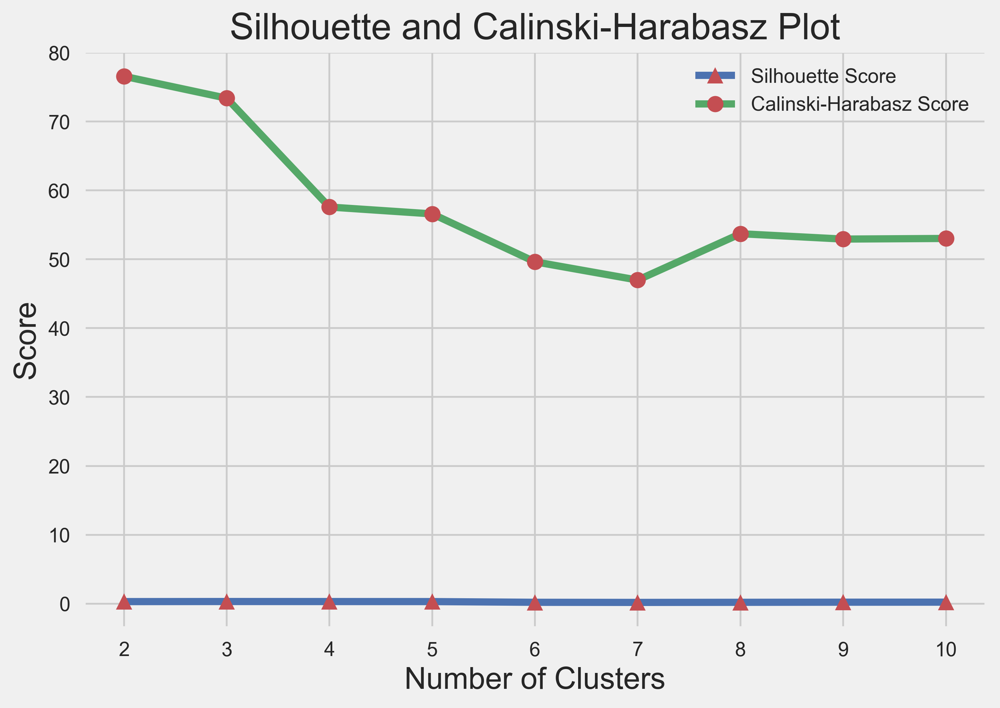

In [64]:
silhouette_scores = []
calinski_harabaz_scores = []
for k in range(2, 11):
    mbkmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    labels = mbkmeans.fit_predict(country_pca)
    silhouette_score_k = silhouette_score(country_pca, labels)
    calinski_harabaz_score_k = calinski_harabasz_score(country_pca, labels)
    silhouette_scores.append(silhouette_score_k)
    calinski_harabaz_scores.append(calinski_harabaz_score_k)

#Create a dataframe to store the scores
scores_mbkmeans = pd.DataFrame({'k': range(2,11),
'Silhouette Score': silhouette_scores,
'Calinski-Harabasz Score': calinski_harabaz_scores})

#Find the best k for each score
best_k_silhouette = scores_mbkmeans.loc[scores_mbkmeans['Silhouette Score'].idxmax(), 'k']
best_k_calinski_harabaz = scores_mbkmeans.loc[scores_mbkmeans['Calinski-Harabasz Score'].idxmax(), 'k']

#Plot the scores for different numbers of clusters
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots()
    ax.plot(scores_mbkmeans['k'], scores_mbkmeans['Silhouette Score'], marker='^', c='b', ms=9, mfc='r', label='Silhouette Score')
    ax.plot(scores_mbkmeans['k'], scores_mbkmeans['Calinski-Harabasz Score'], marker='o', c='g', ms=9, mfc='r', label='Calinski-Harabasz Score')
    ax.set_xticks(range(2, 11))
    ax.set_xlabel("Number of Clusters")
    ax.set_ylabel("Score")
    ax.set_title("Silhouette and Calinski-Harabasz Plot")
    ax.legend()
    plt.show()

In [65]:
print("\nScores for Different Numbers of Clusters:")
scores_mbkmeans


Scores for Different Numbers of Clusters:


,k,Silhouette Score,Calinski-Harabasz Score
0,2,0.297808,76.566823
1,3,0.310333,73.384852
2,4,0.305145,57.583100
3,5,0.300144,56.590089
4,6,0.196568,49.629920
5,7,0.180270,46.979960
6,8,0.194714,53.708969
7,9,0.212519,52.931886
8,10,0.217249,53.023496


In [66]:
# Best k for each score
print(f"\nBest k for Silhouette Score: {best_k_silhouette}")
print(f"Best k for Calinski-Harabasz Score: {best_k_calinski_harabaz}")


Best k for Silhouette Score: 3
Best k for Calinski-Harabasz Score: 2


In [67]:
# Hybrid Score to Find the Best k
def select_k(country_pca):
    silhouette_scores = []
    calinski_scores = []
    k_values = range(2, 11)

    for k in k_values:
        # Perform clustering using KMeans algorithm
        mbkmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
        labels = mbkmeans.fit_predict(country_pca)

        # Calculate Silhouette Score
        silhouette_scores.append(silhouette_score(country_pca, labels))

        # Calculate Calinski-Harabasz Score
        calinski_scores.append(calinski_harabasz_score(country_pca, labels))

    hybrid_scores = np.sqrt(np.multiply(silhouette_scores, calinski_scores))
    best_k = k_values[np.argmax(hybrid_scores)]
    return best_k

best_k = select_k(country_pca)
print("\nBest value of k:", best_k)


Best value of k: 2


In [68]:
# Implement Mini Batch k-means with the Best Number of Clusters
mbkmeans = MiniBatchKMeans(n_clusters=3, random_state=42).fit(country_pca)

# Get the coordinates of the centroids of the three clusters
centroids = mbkmeans.cluster_centers_

# Convert the centroids array to a DataFrame and assign column names
centroids_scaled_col = pd.DataFrame(centroids, columns=country_pca.columns)
centroids_scaled_col

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-2.496026,0.428221,-0.110557,0.683156,-0.198853
1,2.764385,-0.176940,0.115552,0.880084,-0.185879
2,0.132113,-0.174802,0.016853,-0.727257,0.185108


In [69]:
# Get the cluster labels assigned to each data point by mbkmeans
pred_mbkmeans = mbkmeans.labels_

print(f"\nSilhouette Score: {silhouette_score(country_pca, pred_mbkmeans):.2f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz_score(country_pca, pred_mbkmeans):.2f}")


Silhouette Score: 0.31
Calinski-Harabasz Score: 73.38


In [70]:
mbkmeans_scaled_df = pd.concat([df, pd.DataFrame(pred_mbkmeans, columns=['MiniBatch Cluster'])], axis = 1)
mbkmeans_scaled_df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,MiniBatch Cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,2
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


In [71]:
MiniBatch_cluster = mbkmeans_scaled_df.groupby('MiniBatch Cluster').size().to_frame()
MiniBatch_cluster.columns = ["MiniBatch k-means Size"]
MiniBatch_cluster

,MiniBatch k-means Size
MiniBatch Cluster,
0,45
1,36
2,86


In [131]:
df_mbkmeans=df.copy()

In [132]:
df_mbkmeans['cluster'] = mbkmeans.labels_

In [133]:
df_mbkmeans['cluster'].value_counts()

2    86
0    45
1    36
Name: cluster, dtype: int64

In [137]:
df_pair_plotmb=pd.DataFrame(reduced_cr,columns=['PC_' +str(i) for i in range(5)])

In [138]:
df_pair_plotmb['Cluster']= kmeans.labels_ #Add cluster column in the data frame

In [140]:
df_pair_plotmb.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,Cluster
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,0
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,1
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,1
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,0
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,1


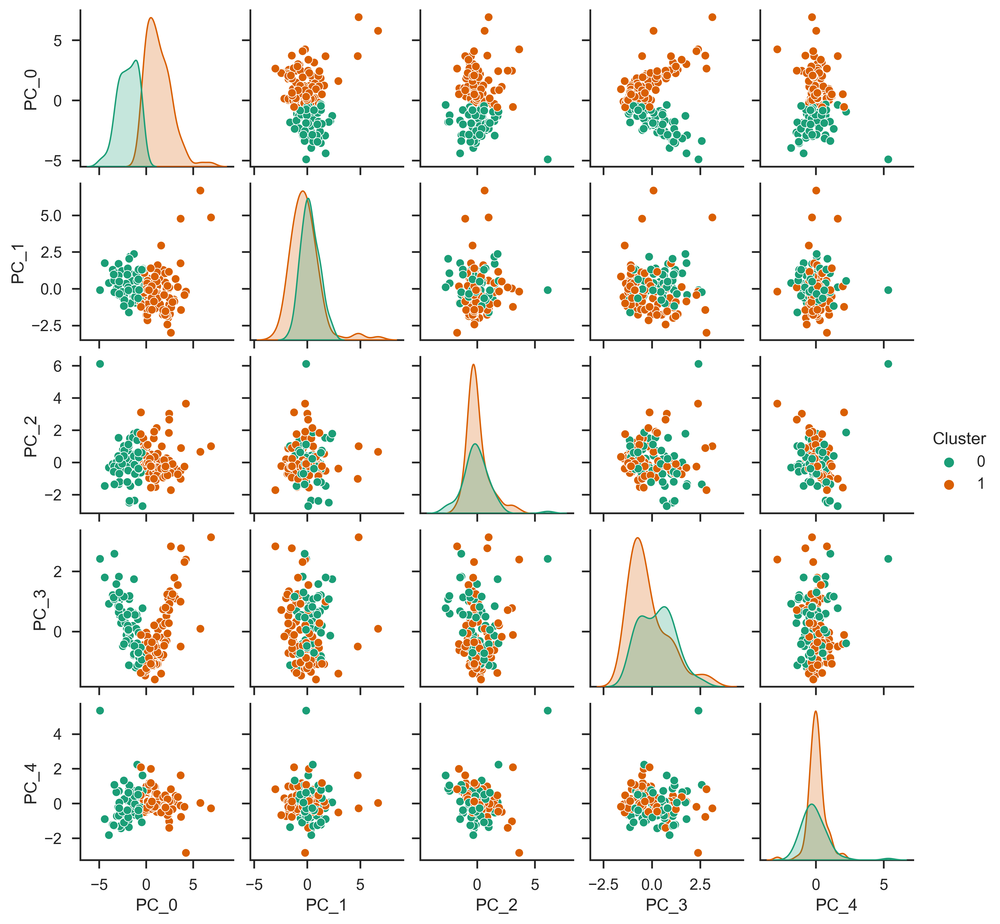

In [141]:
#pairwise relationship of components on the data
sns.pairplot(df_pair_plotmb,hue='Cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [142]:
df_mbkmeans['cluster'].loc[df_mbkmeans['cluster'] == 0] = 'Help Needed'
df_mbkmeans['cluster'].loc[df_mbkmeans['cluster'] == 1] = 'Might Need Help'
df_mbkmeans['cluster'].loc[df_mbkmeans['cluster'] == 2] = 'No Help Needed'

fig = px.choropleth(df_mbkmeans[['country','cluster']],
                    locationmode = 'country names',
                    locations = 'country',
                    title = 'Needed Help Per Country',
                    color = df_mbkmeans['cluster'],  
                    color_discrete_map = {'Help Needed':'Red',
                                        
                                        'Might Need Help':'Yellow',
                                         'No Help Needed':'Green'}
                   )
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

## DBSCAN

In [72]:
df_DBScan =  df.copy()

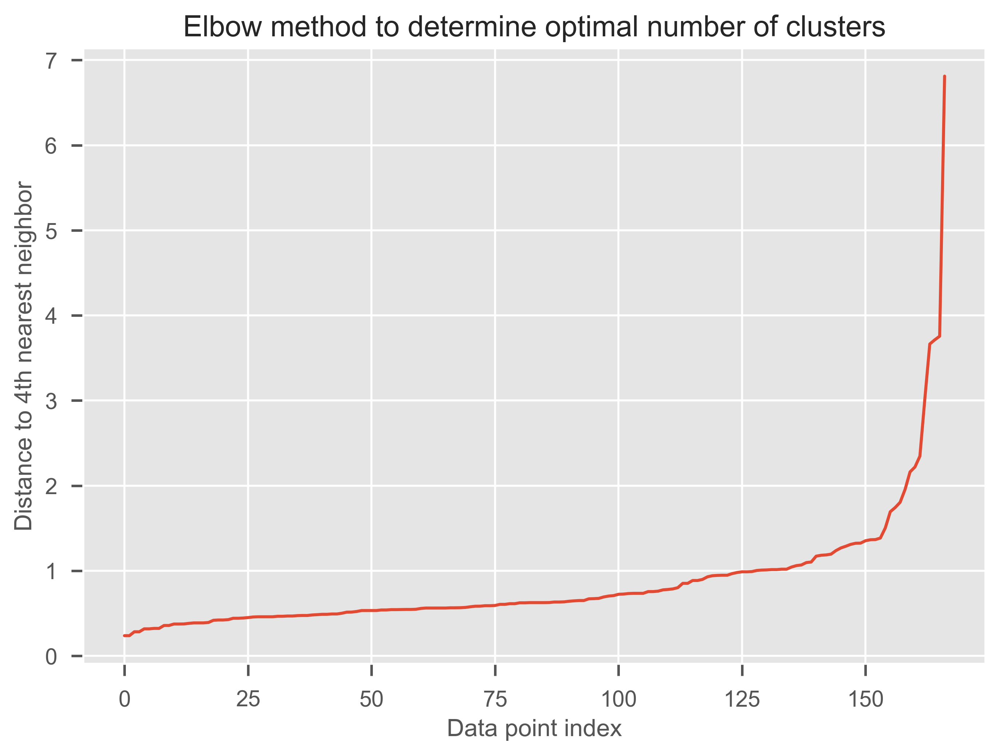

In [73]:
knn = NearestNeighbors(n_neighbors = 7)
model = knn.fit(country_pca)
distances, indices = knn.kneighbors(country_pca)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

with plt.style.context('ggplot'):
    plt.plot(distances)
    plt.xlabel('Data point index')
    plt.ylabel('Distance to 4th nearest neighbor')
    plt.title('Elbow method to determine optimal number of clusters')
    plt.show()

In [74]:
epsilons= np.linspace(0.01,1,num=15)
epsilons

array([0.01      , 0.08071429, 0.15142857, 0.22214286, 0.29285714,
       0.36357143, 0.43428571, 0.505     , 0.57571429, 0.64642857,
       0.71714286, 0.78785714, 0.85857143, 0.92928571, 1.        ])

In [75]:
min_samples= np.arange(2,9,step=1)
min_samples

array([2, 3, 4, 5, 6, 7, 8])

In [76]:
import itertools
combinations= list(itertools.product(epsilons,min_samples))
combinations

[(0.01, 2),
 (0.01, 3),
 (0.01, 4),
 (0.01, 5),
 (0.01, 6),
 (0.01, 7),
 (0.01, 8),
 (0.08071428571428571, 2),
 (0.08071428571428571, 3),
 (0.08071428571428571, 4),
 (0.08071428571428571, 5),
 (0.08071428571428571, 6),
 (0.08071428571428571, 7),
 (0.08071428571428571, 8),
 (0.15142857142857144, 2),
 (0.15142857142857144, 3),
 (0.15142857142857144, 4),
 (0.15142857142857144, 5),
 (0.15142857142857144, 6),
 (0.15142857142857144, 7),
 (0.15142857142857144, 8),
 (0.22214285714285714, 2),
 (0.22214285714285714, 3),
 (0.22214285714285714, 4),
 (0.22214285714285714, 5),
 (0.22214285714285714, 6),
 (0.22214285714285714, 7),
 (0.22214285714285714, 8),
 (0.29285714285714287, 2),
 (0.29285714285714287, 3),
 (0.29285714285714287, 4),
 (0.29285714285714287, 5),
 (0.29285714285714287, 6),
 (0.29285714285714287, 7),
 (0.29285714285714287, 8),
 (0.3635714285714286, 2),
 (0.3635714285714286, 3),
 (0.3635714285714286, 4),
 (0.3635714285714286, 5),
 (0.3635714285714286, 6),
 (0.3635714285714286, 7),
 (0.

In [77]:
N=len(combinations)
N

105

In [78]:
def get_scores_and_labels(combinations,country_pca):
    scores=[]
    all_labels_list=[]
    for i , (eps,num_samples) in enumerate (combinations):
        dbscan_cluster_model=DBSCAN(eps=eps,min_samples=num_samples).fit(country_pca)
        labels= dbscan_cluster_model.labels_
        labels_set= set(labels)
        num_clusters= len(labels_set)
        if -1 in labels_set:
            num_clusters-=1
        if (num_clusters<2) or (num_clusters>50):
            scores.append(-10)
            all_labels_list.append('bad')
            c=(eps,num_samples)
            print(f'combination{c} on iteration {i+1} of {N} has {num_clusters}clusters.Moving on')
            continue
        scores.append (silhouette_score(country_pca,labels))
        all_labels_list.append(labels)
        print (f'Index:{i},Score:{scores[-1]}, Labels: {all_labels_list[-1]},NumClusters :{num_clusters}')
    best_index= np.argmax (scores)
    best_parameters=combinations[ best_index] 
    best_labels= all_labels_list [best_index]
    best_score= scores[best_index] 
    return{'best_epsilon': best_parameters[0],
            'best_min_samples': best_parameters[1],
            'best_labels':best_labels, 
            'best_score': best_score}
best_dict= get_scores_and_labels(combinations, country_pca)

combination(0.01, 2) on iteration 1 of 105 has 0clusters.Moving on
combination(0.01, 3) on iteration 2 of 105 has 0clusters.Moving on
combination(0.01, 4) on iteration 3 of 105 has 0clusters.Moving on
combination(0.01, 5) on iteration 4 of 105 has 0clusters.Moving on
combination(0.01, 6) on iteration 5 of 105 has 0clusters.Moving on
combination(0.01, 7) on iteration 6 of 105 has 0clusters.Moving on
combination(0.01, 8) on iteration 7 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 2) on iteration 8 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 3) on iteration 9 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 4) on iteration 10 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 5) on iteration 11 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 6) on iteration 12 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 7) on iteration 13 of 105 has 0clusters.Moving on
combination(0.08071428571428571, 8)

In [79]:
best_dict

{'best_epsilon': 1.0,
 'best_min_samples': 6,
 'best_labels': array([ 2,  0,  0, -1,  0, -1,  0,  1,  1,  0,  0, -1,  0,  0, -1, -1,  0,
         2,  0,  0,  0, -1,  0, -1,  0,  2, -1,  0,  2,  1,  0,  2,  2,  0,
         0,  0,  2, -1, -1, -1,  2,  0,  0,  0,  1,  0,  0,  0,  0, -1, -1,
         0,  0,  1,  1, -1,  2,  0,  1,  2,  1,  0,  0,  2,  2,  0, -1,  0,
         1,  0,  0,  0, -1, -1,  1,  1,  0,  1, -1,  0,  2, -1, -1,  0,  0,
         0,  0, -1, -1, -1,  0, -1,  0,  2,  2, -1,  0,  2, -1, -1,  0, -1,
        -1, -1,  0,  0,  2, -1,  0,  0, -1,  1,  2, -1, -1, -1, -1,  0,  0,
         0,  0,  0,  1, -1,  0,  0, -1,  0, -1,  2,  0, -1, -1, -1,  0,  0,
        -1, -1,  0,  1, -1,  0, -1,  0,  1, -1,  0,  2,  0, -1, -1,  0,  0,
         0, -1,  2, -1, -1,  1, -1,  0,  0,  0, -1, -1, -1,  2],
       dtype=int64),
 'best_score': 0.1542130729046919}

In [80]:
df_DBScan['cluster']=best_dict['best_labels']
df_DBScan['cluster'].value_counts()

 0    72
-1    56
 2    22
 1    17
Name: cluster, dtype: int64

In [81]:
df_pair_plotDB=pd.DataFrame(reduced_cr,columns=['PC_' +str(i) for i in range(5)])

In [82]:
df_pair_plotDB['Cluster']= best_dict['best_labels'] #Add cluster column in the data frame

In [83]:
df_pair_plotDB.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,Cluster
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,2
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,0
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,0
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,-1
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,0


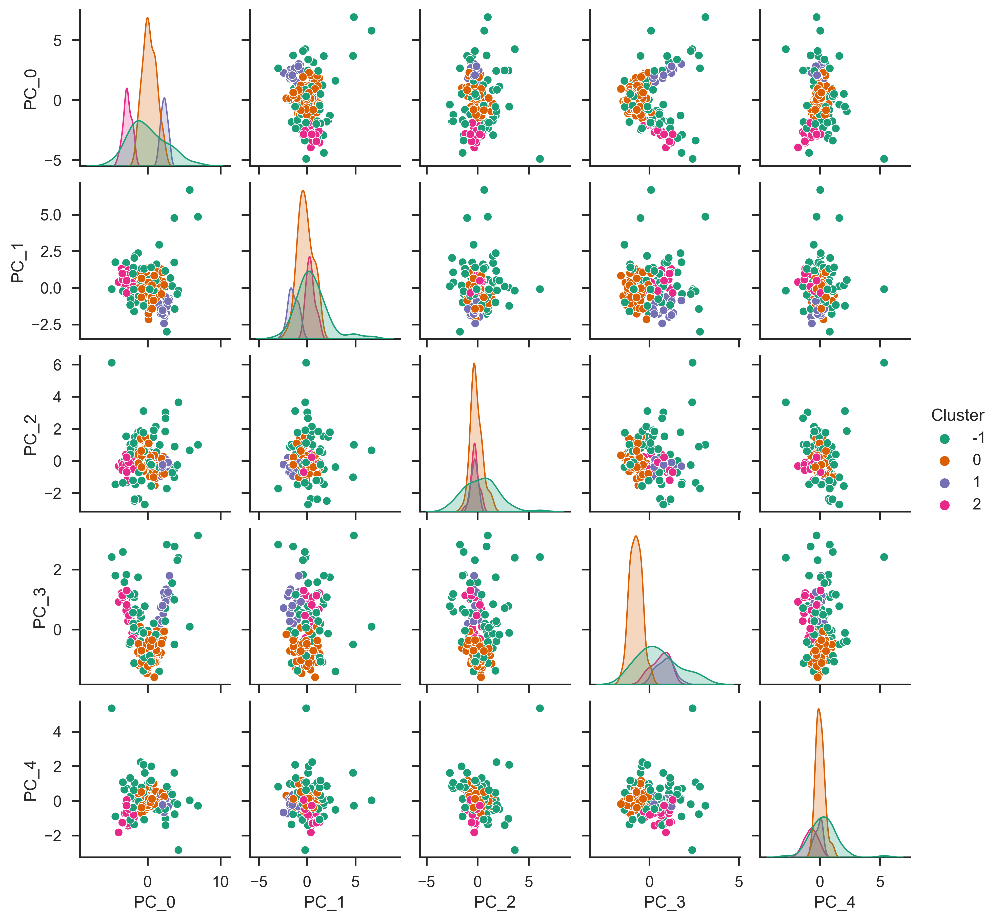

In [84]:
#pairwise relationship of components on the data
sns.pairplot(df_pair_plotDB,hue='Cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [85]:
df_DBScan['cluster'].loc[df_DBScan['cluster'] == -1] = 'Noise / Outliers'
df_DBScan['cluster'].loc[df_DBScan['cluster'] == 0] = 'Might Need Help'
df_DBScan['cluster'].loc[df_DBScan['cluster'] == 1] = 'No Help Needed'
df_DBScan['cluster'].loc[df_DBScan['cluster'] == 2] = 'Help Needed'

fig = px.choropleth(df_DBScan[['country','cluster']],
                    locationmode = 'country names',
                    locations = 'country',
                    title = 'Needed Help Per country',
                    color = df_DBScan['cluster'],  
                    color_discrete_map = {'Noise / Outliers' : 'Black',
                                        'Help Needed':'Red',
                                        'Might Need Help':'Yellow',
                                        'No Help Needed':'Green'})
                                        
                                        
                   
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')